### Subclustering of immune cells

In [1]:
library(Seurat)
library(ggplot2)
library(dplyr)
library(RColorBrewer)
library(gridExtra)
library(ggh4x)

Attaching SeuratObject

Attaching sp


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



Attaching package: ‘gridExtra’


The following object is masked from ‘package:dplyr’:

    combine




In [2]:
imm_pool <- readRDS(file = "/local/Nina/jupyterlab/brains_trans/imm_pool_in.rds")

Warning message:
“Groups with fewer than two data points have been dropped.”
Warning message:
“Groups with fewer than two data points have been dropped.”
Warning message:
“Groups with fewer than two data points have been dropped.”


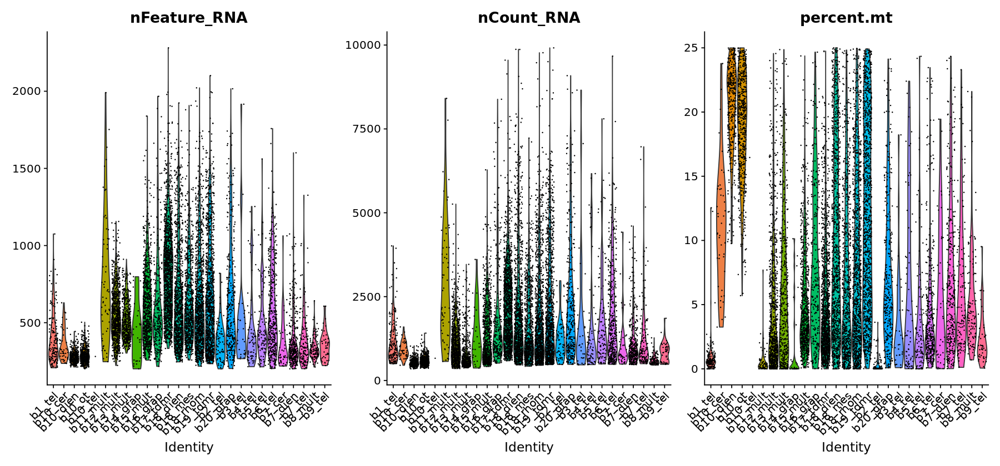

In [3]:
options(repr.plot.width=15, repr.plot.height=7)

qc_plot_rg <- VlnPlot(object = imm_pool, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3, pt.size = 0.05, group.by = "orig.ident")
qc_plot_rg

### Clustering with regression of technical covariates

In [4]:
imm_pool <- NormalizeData(object = imm_pool, normalization.method = "LogNormalize", scale.factor = 1e4)

When using repel, set xnudge and ynudge to 0 for optimal results

Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 2380 rows containing missing values (geom_point).”
Warning message:
“ggrepel: 5 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


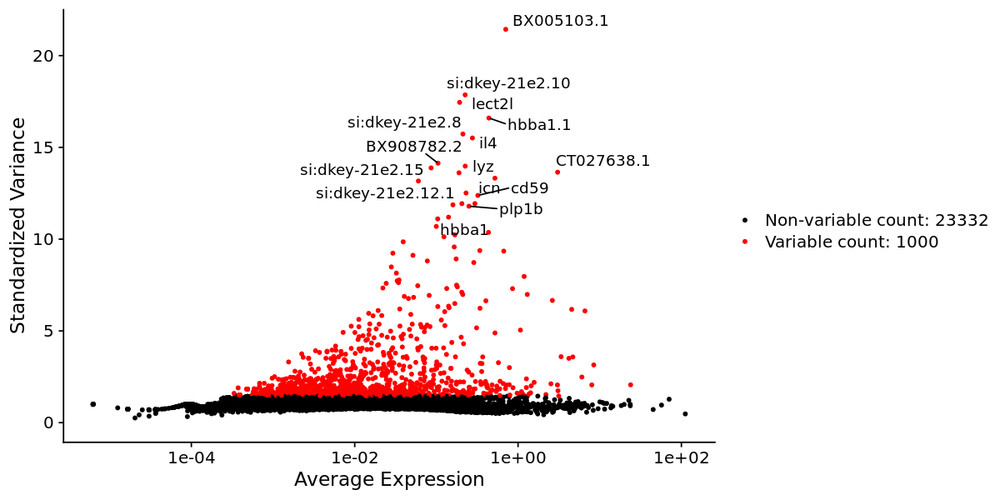

In [5]:
options(repr.plot.width=10, repr.plot.height=5)

imm_pool <- FindVariableFeatures(object = imm_pool, selection.method = 'vst', nfeatures = 1000)

#plot variable features with top vargenes labeled
top20 <- head(x = VariableFeatures(object = imm_pool), 20)
plot_var_feat <- LabelPoints(plot = VariableFeaturePlot(object = imm_pool), points = top20, repel = TRUE)
plot_var_feat

In [8]:
all.genes <- rownames(x = imm_pool)
imm_pool <- ScaleData(object = imm_pool, features = all.genes, vars.to.regress = c("nFeature_RNA","nCount_RNA","percent.mt"))

Regressing out nFeature_RNA, nCount_RNA, percent.mt

Centering and scaling data matrix



PC_ 1 
Positive:  apoc1, ccl34b.1, apoeb, fosl1a, rasgef1ba, zgc:158343, c1qc, clic2, plin2, c1qb 
	   zgc:92066, ctsla, marco, il1b, hbegfb, ctsba, egr1, ccl35.1, ch25h, mafbb 
	   AL928650.1, egr2a, CU499330.1, si:dkey-205h13.1, lgmn, ctsd, hspb1, zgc:153911, hmox1a, BX649485.1 
Negative:  si:ch211-214p16.1, ccl19a.1, ccl36.1, siglec15l, si:ch211-214p16.2, sla2, ccl38.6, si:dkey-33i11.9, hepacam2, il2rb 
	   si:dkey-183i3.6, il4, si:ch211-212d10.1, flt3, FP236356.1, il13, chl1a, si:dkey-21e2.13, batf3, id3 
	   CR753876.1, cldni, hcst, actn1, CU499336.2, zgc:171686, ccl34b.4, BX897691.1, si:dkey-21e2.8, ccr9a 
PC_ 2 
Positive:  ccl19a.1, siglec15l, hepacam2, grn1, chl1a, si:ch211-214p16.2, flt3, cnn3a, si:dkey-23a13.11, cxcl11.6 
	   actn1, aif1l, rgs2, zgc:171686, ccl35.1, tiam1a, zgc:173742, hcst, aim1a, epdl1 
	   grn2, cd209, il12ba, BX897691.1, cxcl11.5, batf3, plekhf1, si:dkey-33i11.9, bik, xcr1a.1 
Negative:  il4, si:ch211-212d10.1, il13, si:dkey-21e2.13, si:dkey-21e2.8, si:dk

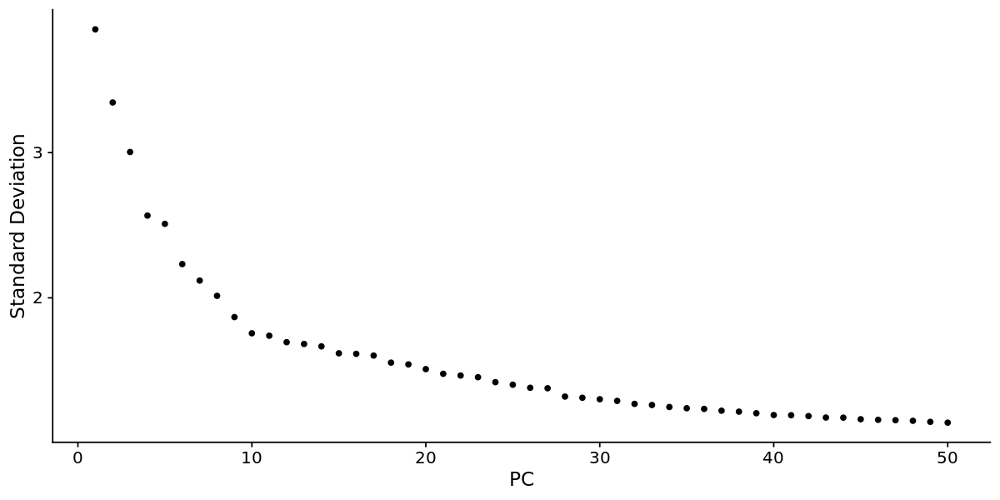

In [10]:
imm_pool <- RunPCA(object = imm_pool)

ElbowPlot(object = imm_pool, ndims = 50)

In [11]:
imm_pool <- FindNeighbors(imm_pool, dims = 1:28, verbose = FALSE)
imm_pool <- FindClusters(imm_pool, resolution = 0.6, verbose = FALSE)

imm_pool <- RunUMAP(imm_pool, dims = 1:28, verbose = FALSE)


Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”


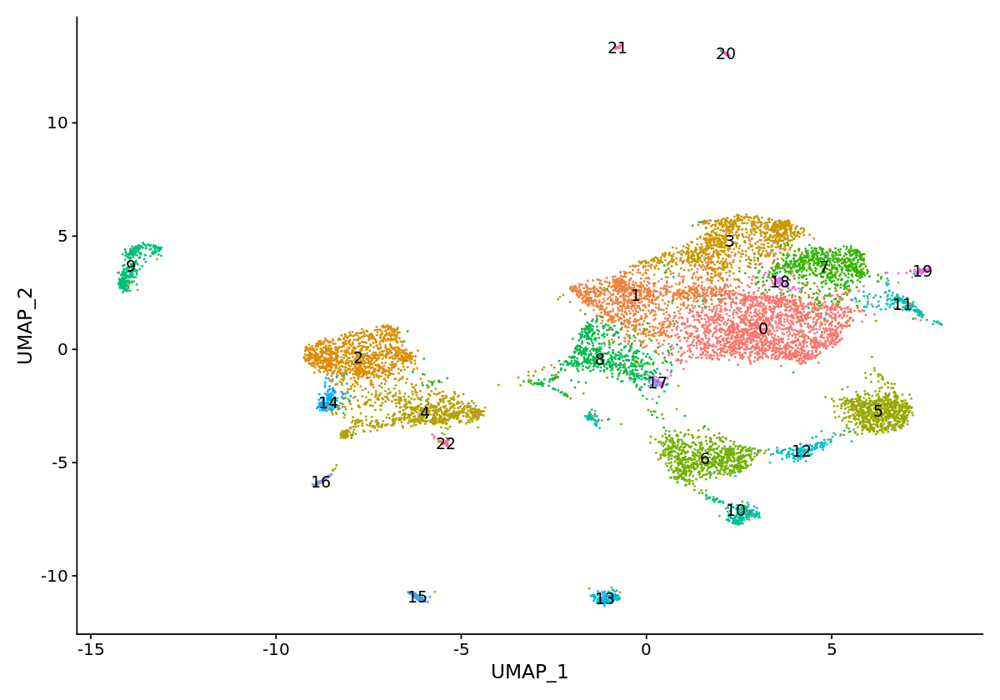

In [12]:
options(repr.plot.width=10, repr.plot.height=7)

DimPlot(imm_pool, label = TRUE) + NoLegend()

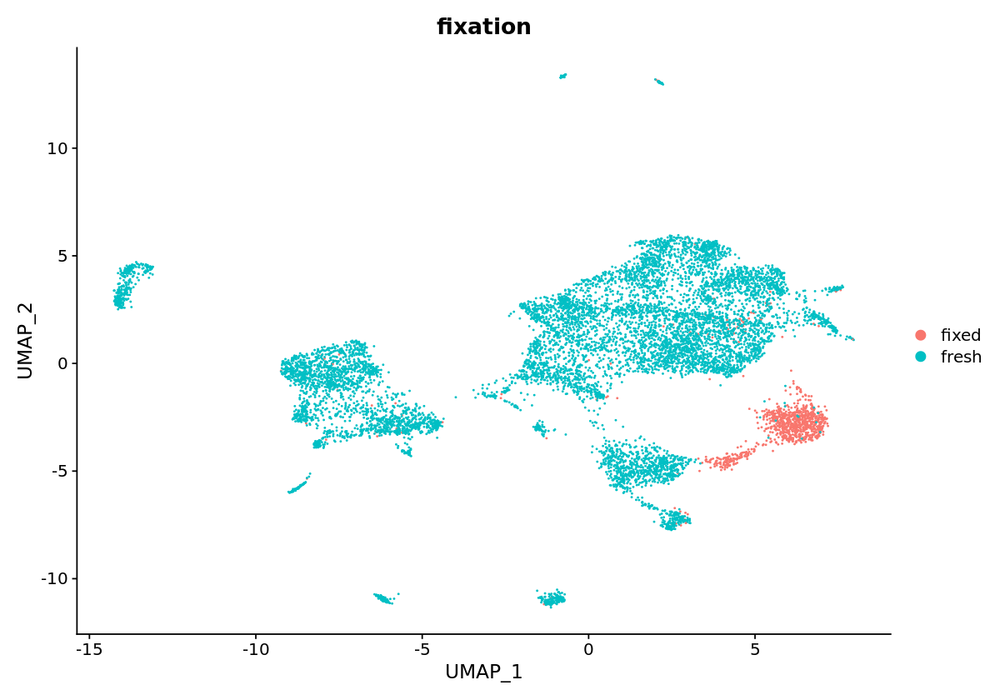

In [13]:
options(repr.plot.width=10, repr.plot.height=7)

DimPlot(imm_pool, group.by = "fixation")

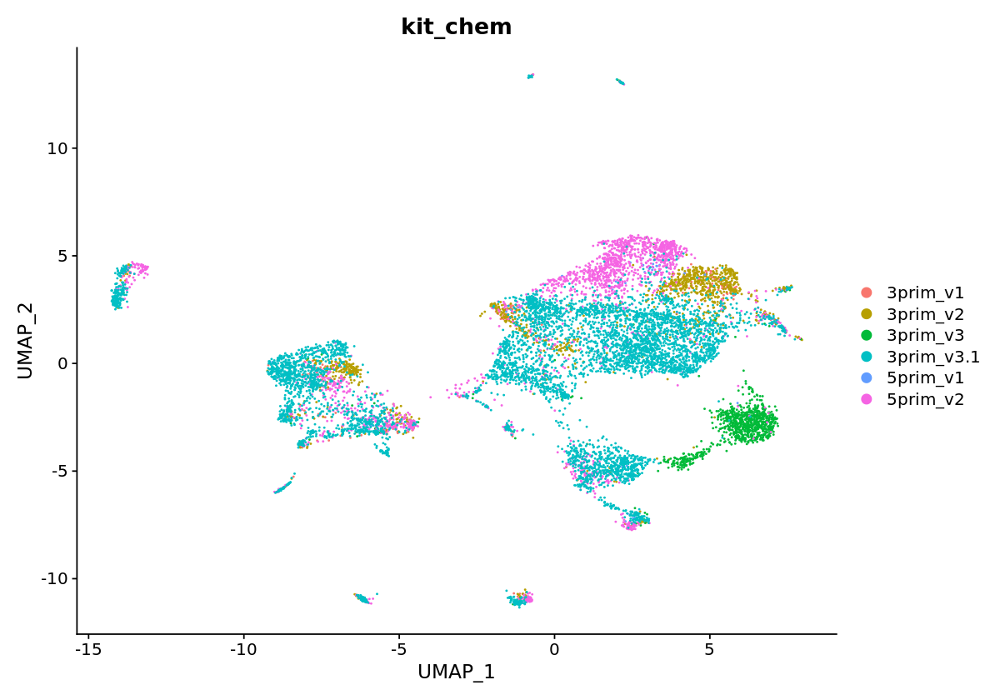

In [14]:
options(repr.plot.width=10, repr.plot.height=7)

DimPlot(imm_pool, group.by = "kit_chem")

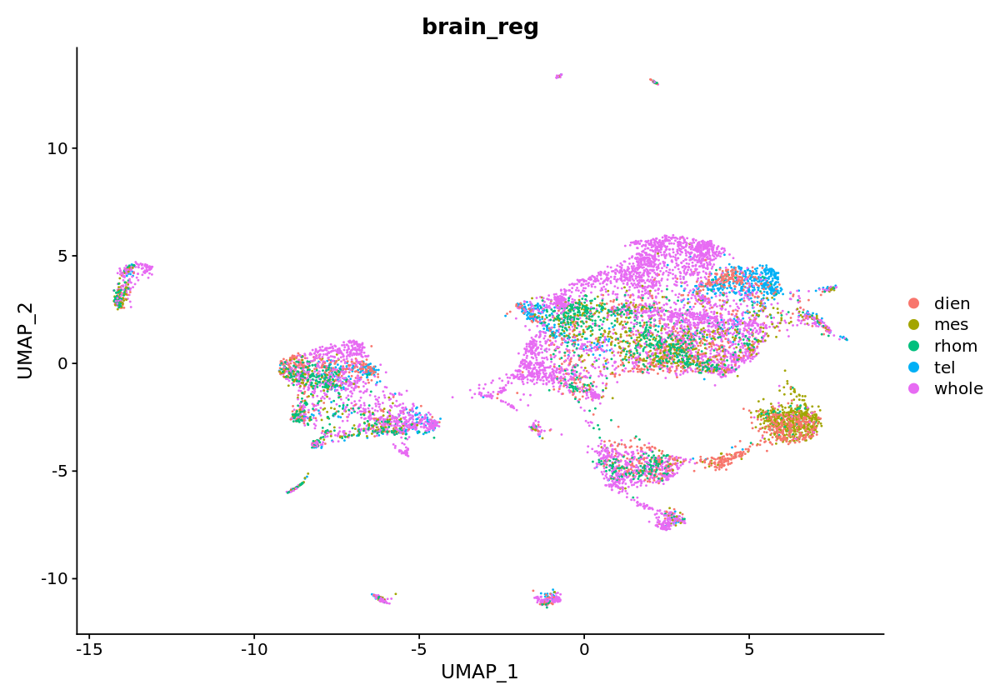

In [15]:
options(repr.plot.width=10, repr.plot.height=7)

DimPlot(imm_pool, group.by = "brain_reg")

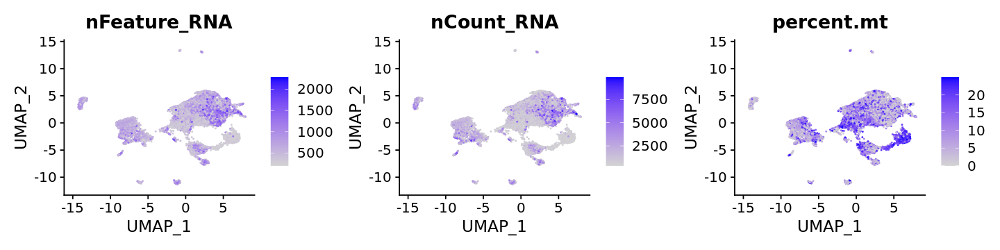

In [16]:
options(repr.plot.width=12, repr.plot.height=3)

FeaturePlot(imm_pool, features = c("nFeature_RNA","nCount_RNA","percent.mt"), ncol = 3, raster = FALSE)

### Clustering with regression of all covariates (including orig.ident)

In [2]:
imm_pool_2 <- readRDS(file = "/local/Nina/jupyterlab/brains_trans/imm_pool_in.rds")

In [3]:
imm_pool_2 <- NormalizeData(object = imm_pool_2, normalization.method = "LogNormalize", scale.factor = 1e4)

When using repel, set xnudge and ynudge to 0 for optimal results

Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 2380 rows containing missing values (geom_point).”
Warning message:
“ggrepel: 5 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


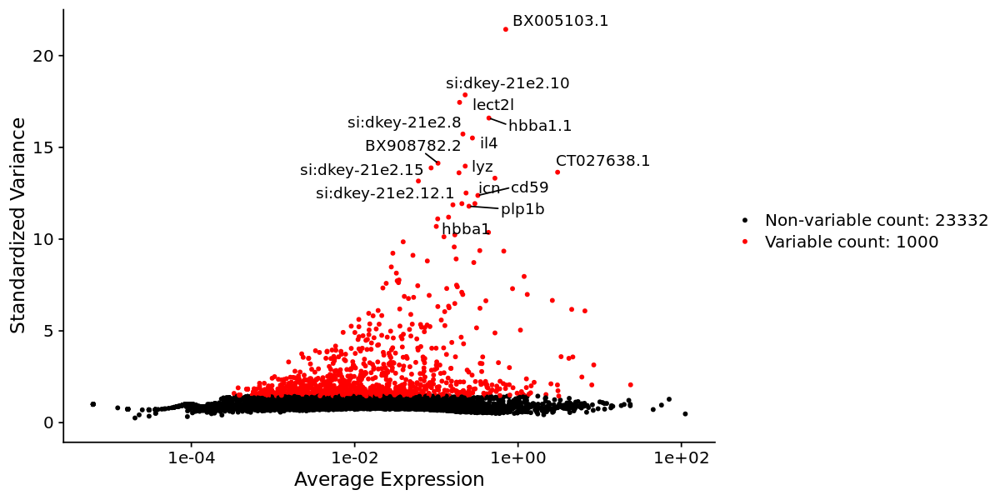

In [4]:
options(repr.plot.width=10, repr.plot.height=5)

imm_pool_2 <- FindVariableFeatures(object = imm_pool_2, selection.method = 'vst', nfeatures = 1000)

#plot variable features with top vargenes labeled
top20 <- head(x = VariableFeatures(object = imm_pool_2), 20)
plot_var_feat <- LabelPoints(plot = VariableFeaturePlot(object = imm_pool_2), points = top20, repel = TRUE)
plot_var_feat

In [5]:
all.genes <- rownames(x = imm_pool_2)
imm_pool_2 <- ScaleData(object = imm_pool_2, features = all.genes, vars.to.regress = c("nFeature_RNA","nCount_RNA","percent.mt", "orig.ident"))

Regressing out nFeature_RNA, nCount_RNA, percent.mt, orig.ident

Centering and scaling data matrix



In [6]:
str(imm_pool_2@commands)

List of 7
 $ RunPCA.RNA              :Formal class 'SeuratCommand' [package "SeuratObject"] with 5 slots
  .. ..@ name       : chr "RunPCA.RNA"
  .. ..@ time.stamp : POSIXct[1:1], format: "2022-04-28 12:50:50"
  .. ..@ assay.used : chr "RNA"
  .. ..@ call.string: chr "RunPCA(object = brain_pool)"
  .. ..@ params     :List of 10
  .. .. ..$ assay          : chr "RNA"
  .. .. ..$ npcs           : num 50
  .. .. ..$ rev.pca        : logi FALSE
  .. .. ..$ weight.by.var  : logi TRUE
  .. .. ..$ verbose        : logi TRUE
  .. .. ..$ ndims.print    : int [1:5] 1 2 3 4 5
  .. .. ..$ nfeatures.print: num 30
  .. .. ..$ reduction.name : chr "pca"
  .. .. ..$ reduction.key  : chr "PC_"
  .. .. ..$ seed.use       : num 42
 $ FindNeighbors.RNA.pca   :Formal class 'SeuratCommand' [package "SeuratObject"] with 5 slots
  .. ..@ name       : chr "FindNeighbors.RNA.pca"
  .. ..@ time.stamp : POSIXct[1:1], format: "2022-04-28 13:37:33"
  .. ..@ assay.used : chr "RNA"
  .. ..@ call.string: chr "FindNeig

PC_ 1 
Positive:  apoc1, ccl34b.1, apoeb, fosl1a, rasgef1ba, egr1, si:dkey-205h13.1, zgc:158343, hspb1, c1qc 
	   clic2, ch25h, c1qb, egr2a, il1b, CU499330.1, hbegfb, marco, plin2, AL928650.1 
	   ccl35.1, ctsba, mafbb, ctsla, mhc2dab, zgc:153911, si:ch211-131k2.3, BX649485.1, timp4.3, zgc:92066 
Negative:  si:ch211-214p16.1, sla2, si:ch211-212d10.1, ccl36.1, il4, ccl38.6, il13, si:dkey-21e2.13, si:ch211-214p16.2, ccl19a.1 
	   CU499336.2, si:dkey-33i11.9, siglec15l, si:dkey-183i3.6, id3, si:dkey-21e2.8, ccr9a, si:dkey-21e2.10, il2rb, cldni 
	   FP236356.1, FP015850.1, si:ch73-47f2.1, ccl34b.4, hepacam2, si:dkey-8e10.2, arg2, flt3, chl1a, tnfrsf9b 
PC_ 2 
Positive:  ccl19a.1, siglec15l, hepacam2, grn1, chl1a, si:ch211-214p16.2, flt3, cnn3a, si:dkey-23a13.11, actn1 
	   aif1l, cxcl11.6, zgc:171686, rgs2, tiam1a, si:dkey-33i11.9, zgc:173742, hcst, ccl35.1, aim1a 
	   epdl1, batf3, BX897691.1, grn2, cd209, il12ba, cxcl11.5, bik, plekhf1, xcr1a.1 
Negative:  il4, si:ch211-212d10.1, il13, s

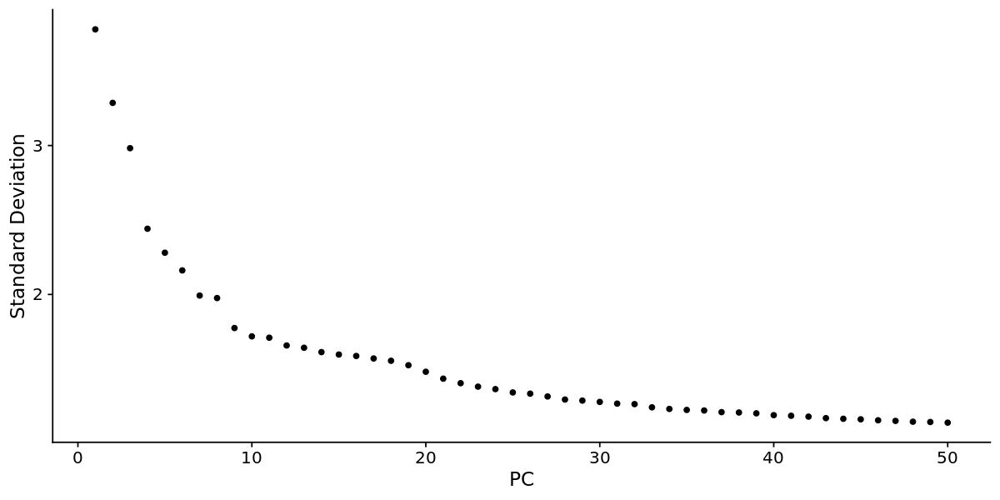

In [7]:
imm_pool_2 <- RunPCA(object = imm_pool_2)

ElbowPlot(object = imm_pool_2, ndims = 50)

In [38]:
imm_pool_2 <- FindNeighbors(imm_pool_2, dims = 1:20, verbose = FALSE)
imm_pool_2 <- FindClusters(imm_pool_2, resolution = 0.6, verbose = FALSE)

imm_pool_2 <- RunUMAP(imm_pool_2, dims = 1:20, verbose = FALSE)


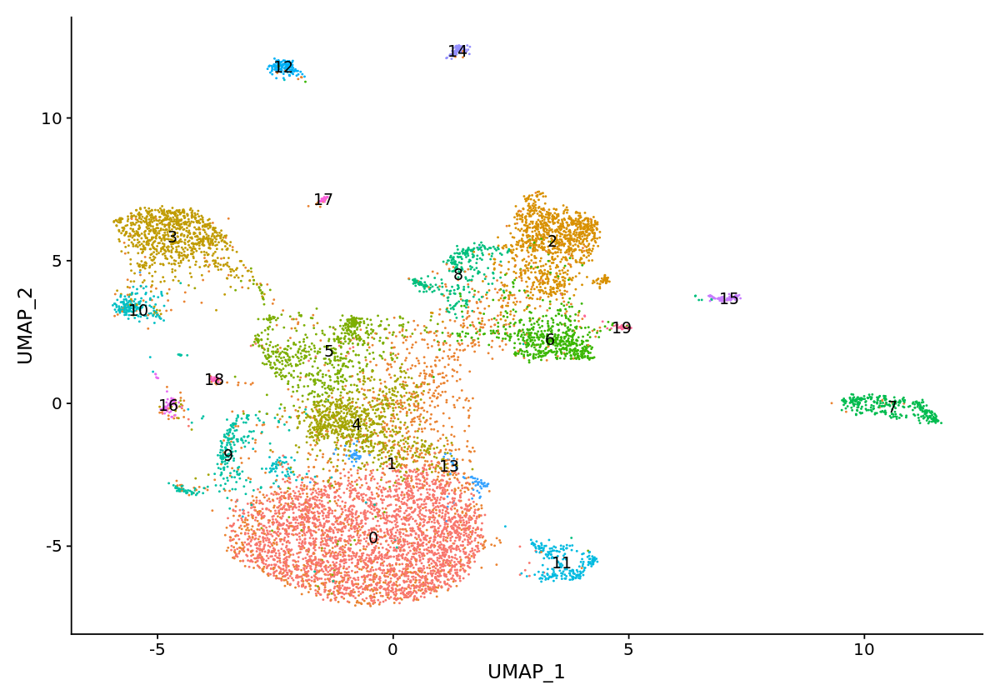

In [39]:
options(repr.plot.width=10, repr.plot.height=7)

DimPlot(imm_pool_2, label = TRUE) + NoLegend()

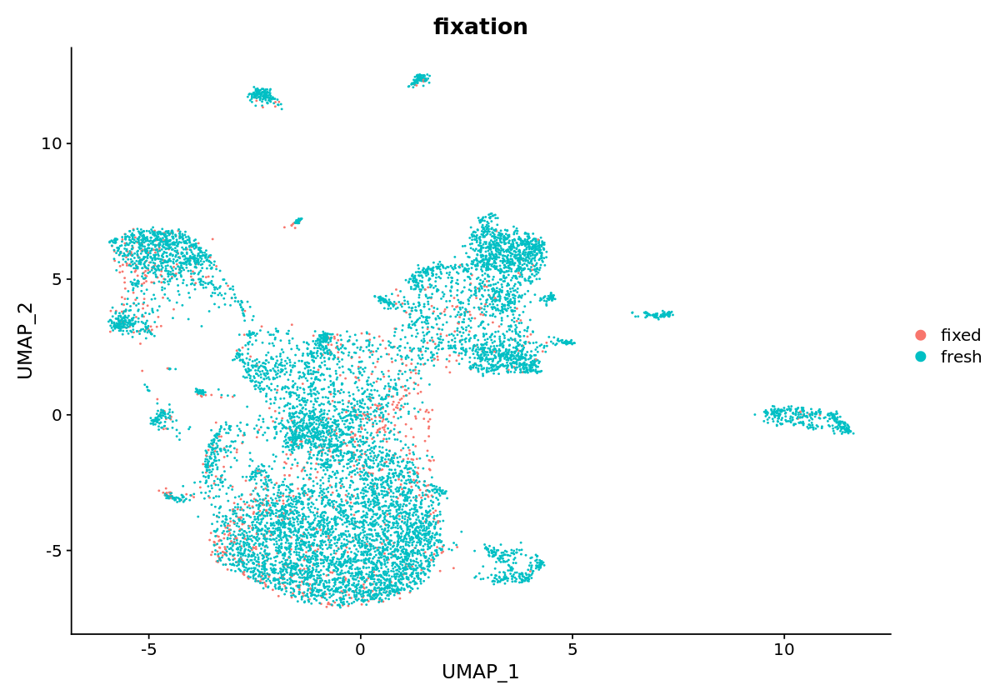

In [40]:
options(repr.plot.width=10, repr.plot.height=7)

DimPlot(imm_pool_2, group.by = "fixation")

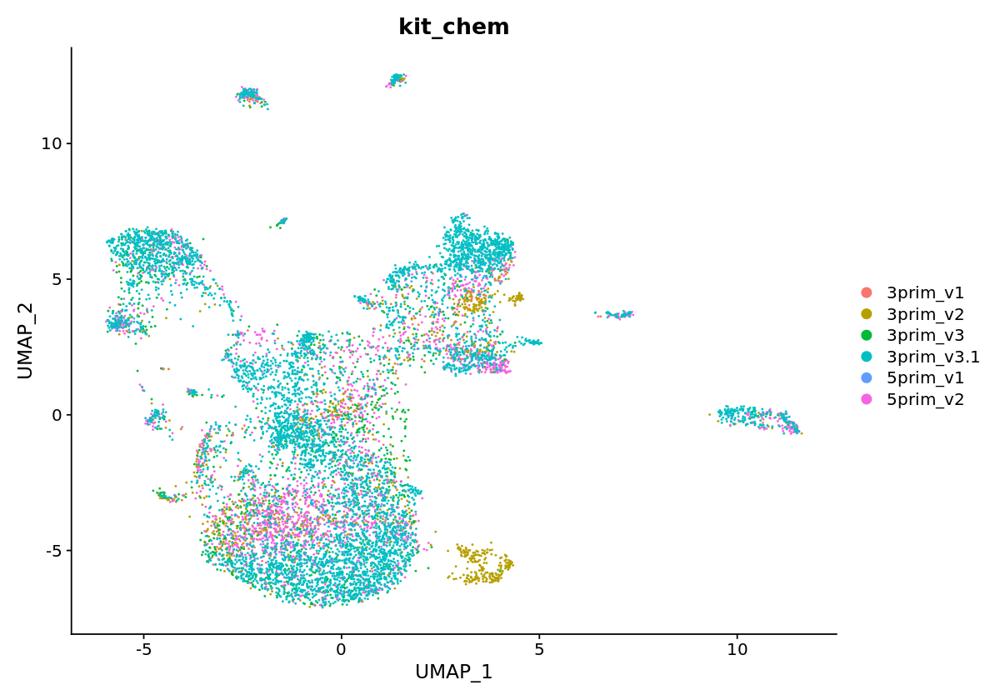

In [41]:
options(repr.plot.width=10, repr.plot.height=7)

DimPlot(imm_pool_2, group.by = "kit_chem")

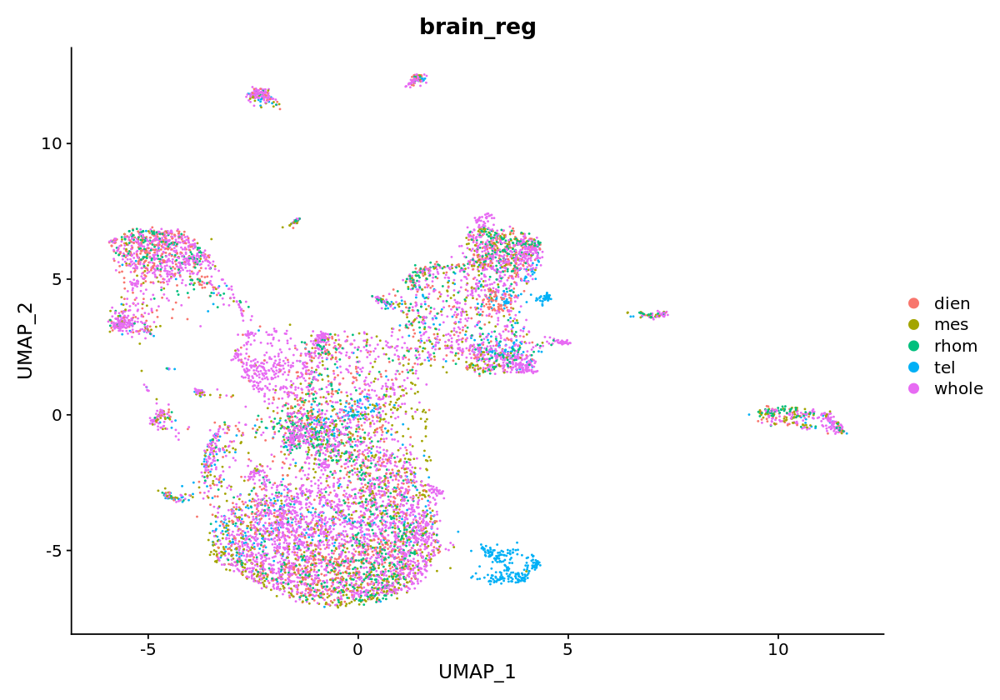

In [33]:
options(repr.plot.width=10, repr.plot.height=7)

DimPlot(imm_pool_2, group.by = "brain_reg")

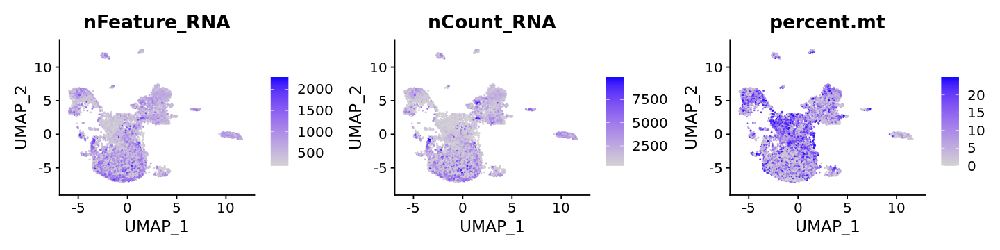

In [13]:
options(repr.plot.width=12, repr.plot.height=3)

FeaturePlot(imm_pool_2, features = c("nFeature_RNA","nCount_RNA","percent.mt"), ncol = 3, raster = FALSE)

In [14]:
# save embedding with regression
saveRDS(imm_pool_2, file = "/local/Nina/jupyterlab/brains_trans/imm_pool_reg.rds")

### Identify cluster-specific markers
Use the embedding with regression of all covariates.

In [2]:
imm_pool <- readRDS(file = "/local/Nina/jupyterlab/brains_trans/imm_pool_reg.rds")

In [15]:
imm_pool <- imm_pool_2

In [5]:
# save original numeric names as separate metadata
imm_pool$pc20_res0.6_clusters_numeric <- Idents(imm_pool)

In [6]:
str(imm_pool@meta.data)

'data.frame':	10234 obs. of  19 variables:
 $ orig.ident                  : chr  "b1_tel" "b1_tel" "b1_tel" "b1_tel" ...
 $ nCount_RNA                  : num  1362 557 544 1081 518 ...
 $ nFeature_RNA                : int  353 236 211 328 232 504 618 1075 501 448 ...
 $ multiseq.relative.1.7       : chr  NA NA NA NA ...
 $ brain_reg                   : chr  "tel" "tel" "tel" "tel" ...
 $ kit_chem                    : chr  "3prim_v1" "3prim_v1" "3prim_v1" "3prim_v1" ...
 $ fixation                    : chr  "fresh" "fresh" "fresh" "fresh" ...
 $ percent.mt                  : num  2.103 1.409 0 0.799 0.175 ...
 $ ident                       : chr  "b1_tel" "b1_tel" "b1_tel" "b1_tel" ...
 $ scDblFinder.class           : chr  "singlet" "singlet" "singlet" "singlet" ...
 $ scDblFinder.score           : num  0.0455 0.03043 0.00503 0.02666 0.02809 ...
 $ scDblFinder.weighted        : num  0.189 0.245 0.174 0.173 0.229 ...
 $ scDblFinder.cxds_score      : num  9.41e-03 2.01e-02 2.91e-05 9.33e-

#### Find and select useful markers

In [17]:
# find markers
imm_pool.mct.markers.bimod <- FindAllMarkers(object = imm_pool, only.pos = TRUE, min.pct = 0.2, logfc.threshold = 0.2, test.use = "bimod")
imm_pool.mct.markers.bimod %>% group_by(cluster) %>% top_n(n = 2, wt = avg_log2FC)
write.csv(imm_pool.mct.markers.bimod, file = "/local/Nina/jupyterlab/brains_trans/imm_pool_reg_20pcs_res0-6_markers_bimod.csv")

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16

Calculating cluster 17

Calculating cluster 18

Calculating cluster 19



p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
0.000000e+00,2.159754,0.676,0.226,0.000000e+00,0,si:dkey-205h13.1
3.688968e-223,2.140688,0.344,0.091,8.975998e-219,0,si:ch211-131k2.3
1.439681e-273,1.699038,0.944,0.899,3.503032e-269,1,NC-002333.4
2.246890e-113,1.691451,0.221,0.068,5.467132e-109,1,atp1b1b
0.000000e+00,4.587088,0.801,0.015,0.000000e+00,2,ccl38.6
0.000000e+00,3.860103,0.758,0.023,0.000000e+00,2,ccl36.1
0.000000e+00,5.227066,0.905,0.037,0.000000e+00,3,ccl19a.1
0.000000e+00,4.551855,0.770,0.010,0.000000e+00,3,siglec15l
1.440316e-315,1.928957,0.973,0.520,3.504577e-311,4,ccl34b.1


In [3]:
#imm_pool.mct.markers.bimod <- read.csv(file = "/local/Nina/jupyterlab/brains_trans/imm_pool_reg_20pcs_res0-6_markers_bimod.csv")

Use FeaturePlots (below) to inspect all clusters, then record cluster-specific markers (unique ones if possible and those shared between subset of clusters). Based on this I will merge clusters that share a similar expression profile.

In [5]:
table(imm_pool@active.ident)


   0    1    2    3    4    5    6    7    8    9   10   11   12   13   14   15 
2784 1697 1026  860  839  643  567  285  276  253  224  211  143   92   88   72 
  16   17   18   19 
  56   46   37   35 

In [27]:
# record genes with specific spatial expression for each cluster (unique and shared with other clusters)
unique_markers <- list()
unique_markers[["cluster_0"]] <- c("egr2a", "egr1", "sdc4", "vmp1", "il1b", "cxcl8a", "clic2", "dusp5") 
unique_markers[["cluster_1"]] <- c() # no unique markers + very unusual (spread out) position in umap - maybe merge with 0??
unique_markers[["cluster_2"]] <- c("ccl38.6", "ccl36.1", "il2rb")
unique_markers[["cluster_3"]] <- c("siglec15l", "hepacam2", "chl1a")
unique_markers[["cluster_4"]] <- c() # none unique? similar to 0 minus some 0-specific markers
unique_markers[["cluster_5"]] <- c("hbba1.1", "cd59", "plp1b", "mpz", "fabp7a", "epd") # these are markers of other cell types - likely doublet cluster
unique_markers[["cluster_6"]] <- c("ccl34b.4", "cxcr4a", "zap70") 
unique_markers[["cluster_7"]] <- c("il4", "il13", "il11b", "cldni")
unique_markers[["cluster_8"]] <- c("BX005103.1", "si:ch211-207g17.3", "vaspa", "mef2b", "lcp2b")
unique_markers[["cluster_9"]] <- c("ccl34a.4", "si:dkey-5n18.1", "s100a10b", "krt8")
unique_markers[["cluster_10"]] <- c("BX323596.2", "ccl35.2", "cxcl11.6")
unique_markers[["cluster_11"]] <- c() # none unique beyond salt-and-pepper noise
unique_markers[["cluster_12"]] <- c("p2rx3a", "BX649442.1", "p2rx3b", "ctsbb")
unique_markers[["cluster_13"]] <- c() # none unique beyond salt-and-pepper noise, merge with 0 or 1
unique_markers[["cluster_14"]] <- c("ighv1-4", "igic1s1", "igl3v5")
unique_markers[["cluster_15"]] <- c("tppp", "cfbl", "spink4")
unique_markers[["cluster_16"]] <- c("hmgn2", "mki67", "top2a", "cdk1")
unique_markers[["cluster_17"]] <- c("lyz", "npsn", "scpp8", "mpx")
unique_markers[["cluster_18"]] <- c("apln", "fn1b", "admb", "itga2b", "mpl", "sele")
unique_markers[["cluster_19"]] <- c("rag1", "cd8b", "fam117aa", "arpp21") 

In [28]:
# shared across multiple
shared_markers <- list()
shared_markers[["cluster_0"]] <- c("ch25h", # with 3
                                   "apoeb", "lgals3bpb", "apoc1" # with 1, 4, 5, 11, 13
                                  )
shared_markers[["cluster_1"]] <- c("plin2", "vmp1", "edrf1") # none very clear. this is a strange cluster
shared_markers[["cluster_2"]] <- c("sla2", "id3", "sik1", "myca", "srgn", "wasa")
shared_markers[["cluster_3"]] <- c("ccl19a.1", "grn1", "aif1l", "flt3") # mostly with adjacent 10
shared_markers[["cluster_4"]] <- c("ccl34b.1", "gng10", "fcer1gl", "lta4h") 
shared_markers[["cluster_5"]] <- c() # none - this marker is "unique" in its cross contamination with other cell types
shared_markers[["cluster_6"]] <- c("ccr9a", "stk17al") # plus many more with 2 and 8
shared_markers[["cluster_7"]] <- c("srgn", "sik1")
shared_markers[["cluster_8"]] <- c() # several with 2 and 6, mentioned there
shared_markers[["cluster_9"]] <- c("icn", "ctsd", "c1qb", "lgmn") # slightly unsual pattern - shares different genes with subsets of immune - maybe imm-imm doublet??
shared_markers[["cluster_10"]] <- c("sftpbb", "epdl1", "lygl1", #12
                                   "grn1", "id2a" #10
                                   )
shared_markers[["cluster_11"]] <- c("ccl34b.1", "lgals9l1", "tspan36") #shared with 0, 1, 4
shared_markers[["cluster_12"]] <- c("sftpbb", "lgals2a")
shared_markers[["cluster_13"]] <- c() # most shared with 0 or 1
shared_markers[["cluster_14"]] <- c("cxcr4a", "ccr9a", "dap1b")
shared_markers[["cluster_15"]] <- c() # most are unique or unspecific
shared_markers[["cluster_16"]] <- c() # most are unique or unspecific
shared_markers[["cluster_17"]] <- c("icn", "srgn", "scinlb")
shared_markers[["cluster_18"]] <- c() # most are unique or unspecific
shared_markers[["cluster_19"]] <- c("pde4ba", "arg2", "runx3") # most shared with 6 or 6/8/2

In [6]:
# get genes from single cluster in desc fold change order
genes.single.cluster.bimod <- function(x, markerlist){
  genes.only <- markerlist %>% filter (cluster ==x ) %>% arrange(desc(avg_log2FC)) %>% select(gene)
}

# get genes for each cluster 
for (cluster in levels(imm_pool@active.ident)) {
  genelist.cluster <- genes.single.cluster.bimod(cluster, imm_pool.mct.markers.bimod)
  genelist.cluster <- genelist.cluster$gene
  topgenes <- head(genelist.cluster, 40)
  assign(paste0("cluster_",cluster, "_top40"), topgenes)
}

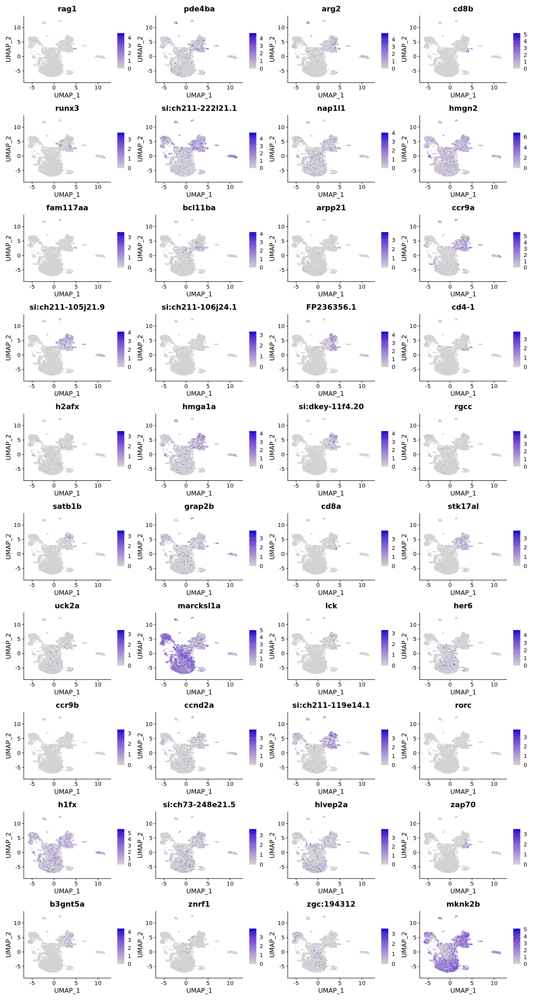

In [16]:
options(repr.plot.width=16, repr.plot.height=30)

FeaturePlot(object = imm_pool, reduction = 'umap', features = cluster_19_top40, 
            ncol = 4, cols = c("lightgrey","mediumblue"),
           raster = FALSE)

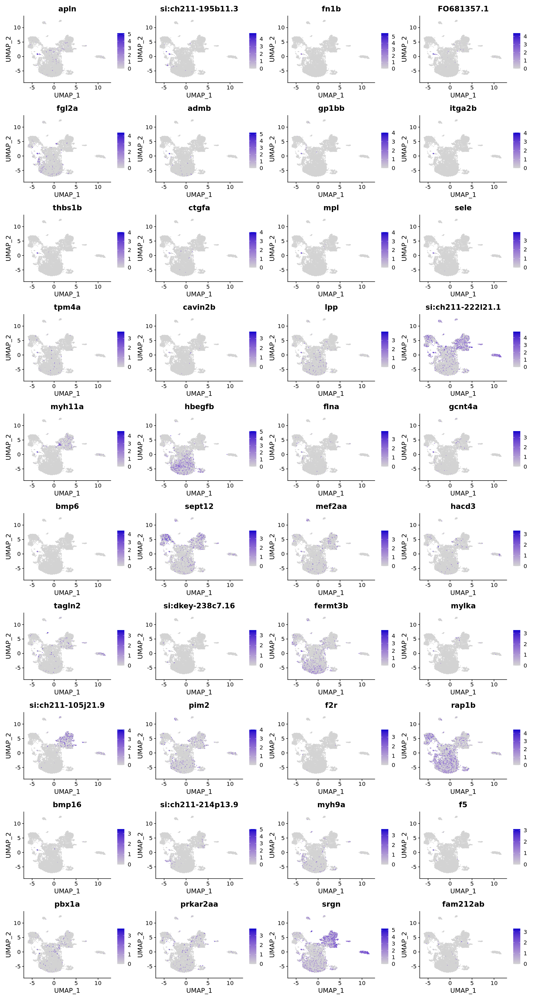

In [15]:
options(repr.plot.width=16, repr.plot.height=30)

FeaturePlot(object = imm_pool, reduction = 'umap', features = cluster_18_top40, 
            ncol = 4, cols = c("lightgrey","mediumblue"),
           raster = FALSE)

Use DotPlot to validate and if necessary refine marker selection.

In [29]:
unique_markers_vector <- unlist(unique_markers)
unique_markers_vector <- unname(unique_markers_vector)
unique_markers_vector

[1] "egr2a"             "egr1"              "sdc4"             
 [4] "vmp1"              "il1b"              "cxcl8a"           
 [7] "clic2"             "dusp5"             "ccl38.6"          
[10] "ccl36.1"           "il2rb"             "siglec15l"        
[13] "hepacam2"          "chl1a"             "hbba1.1"          
[16] "cd59"              "plp1b"             "mpz"              
[19] "fabp7a"            "epd"               "ccl34b.4"         
[22] "cxcr4a"            "zap70"             "il4"              
[25] "il13"              "il11b"             "cldni"            
[28] "BX005103.1"        "si:ch211-207g17.3" "vaspa"            
[31] "mef2b"             "lcp2b"             "ccl34a.4"         
[34] "si:dkey-5n18.1"    "s100a10b"          "krt8"             
[37] "BX323596.2"        "ccl35.2"           "cxcl11.6"         
[40] "p2rx3a"            "BX649442.1"        "p2rx3b"           
[43] "ctsbb"             "ighv1-4"           "igic1s1"          
[46] "igl3v5"            "tppp"              "cfbl"             
[49] "spink4"            "hmgn2"             "mki67"            
[52] "top2a"             "cdk1"              "lyz"              
[55] "npsn"              "scpp8"             "mpx"              
[58] "apln"              "fn1b"              "admb"             
[61] "itga2b"            "mpl"               "sele"             
[64] "rag1"              "cd8b"              "fam117aa"         
[67] "arpp21"

In [30]:
shared_markers_vector <- unlist(shared_markers)
shared_markers_vector <- unname(shared_markers_vector)
#remove duplicates
shared_markers_vector <- unique(shared_markers_vector)
shared_markers_vector

[1] "ch25h"     "apoeb"     "lgals3bpb" "apoc1"     "plin2"     "vmp1"     
 [7] "edrf1"     "sla2"      "id3"       "sik1"      "myca"      "srgn"     
[13] "wasa"      "ccl19a.1"  "grn1"      "aif1l"     "flt3"      "ccl34b.1" 
[19] "gng10"     "fcer1gl"   "lta4h"     "ccr9a"     "stk17al"   "icn"      
[25] "ctsd"      "c1qb"      "lgmn"      "sftpbb"    "epdl1"     "lygl1"    
[31] "id2a"      "lgals9l1"  "tspan36"   "lgals2a"   "cxcr4a"    "dap1b"    
[37] "scinlb"    "pde4ba"    "arg2"      "runx3"

In [31]:
# plot together
all_markers_vector <- c(unique_markers_vector, shared_markers_vector)
all_markers_vector <- unique(all_markers_vector)

In [59]:
length(all_markers_vector)

[1] 105

Warning message in FetchData(object = object, vars = features, cells = cells):
“The following requested variables were not found: si:ch211-207g13.7”


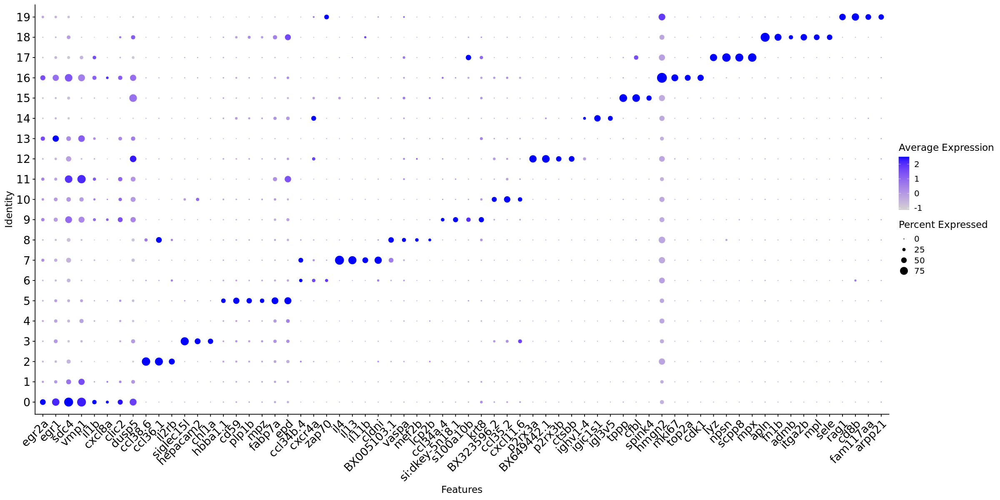

In [13]:
options(repr.plot.width=20, repr.plot.height=10)

dotplot_unique <- DotPlot(imm_pool, features = unique_markers_vector) + theme(axis.text.x = element_text(angle = 45, size = 16, hjust = 1, vjust = 1), axis.text.y = element_text(size = 16)) + RotatedAxis()
dotplot_unique

Warning message in FetchData(object = object, vars = features, cells = cells):
“The following requested variables were not found: ccl34b1, cstd”


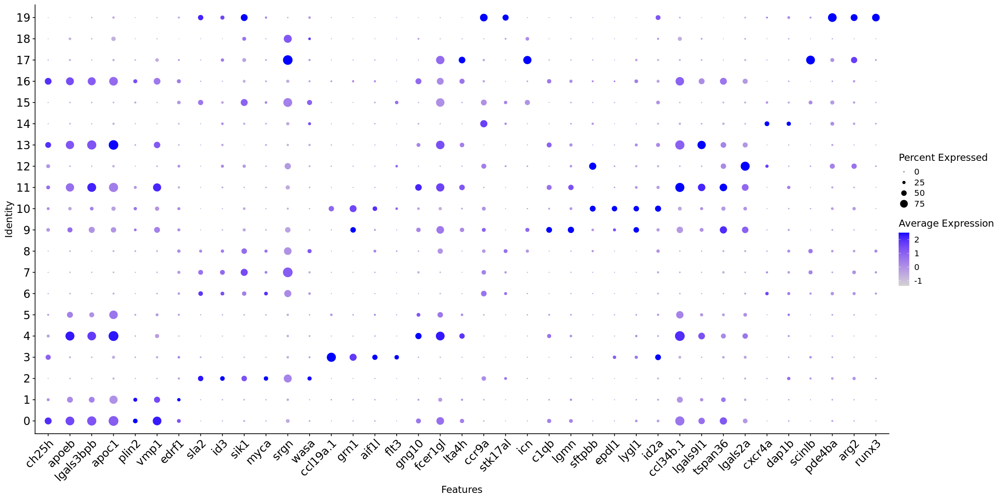

In [15]:
options(repr.plot.width=20, repr.plot.height=10)

dotplot_shared <- DotPlot(imm_pool, features = shared_markers_vector) + theme(axis.text.x = element_text(angle = 45, size = 16, hjust = 1, vjust = 1), axis.text.y = element_text(size = 16)) + RotatedAxis()
dotplot_shared

Warning message in FetchData(object = object, vars = features, cells = cells):
“The following requested variables were not found: si:ch211-207g13.7, ccl34b1, cstd”


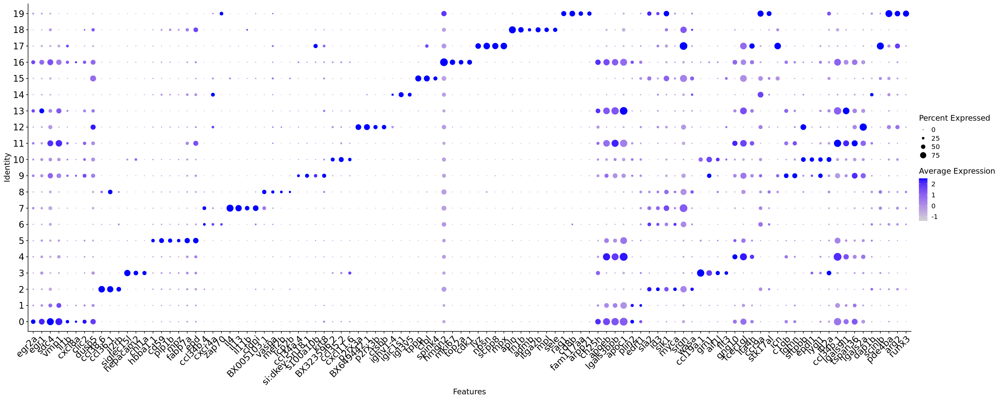

In [16]:
options(repr.plot.width=25, repr.plot.height=10)

dotplot_all <- DotPlot(imm_pool, features = all_markers_vector) + theme(axis.text.x = element_text(angle = 45, size = 16, hjust = 1, vjust = 1), axis.text.y = element_text(size = 16)) + RotatedAxis()
dotplot_all

#### QC: check fraction of orig.ident per cluster

Before I start merging clusters based on similarity, I want to make sure that all the clusters have at least two libraries supporting them (ie no strong batch effect). Those that exhibit batch effect are good candidates for merging with similar cluster or exclusion from the dataset.    
As a minimal heuristic for now I look into whether any cluster is made >90% of a single library.  

In [17]:
orig.ident.by.cluster <- table(imm_pool$orig.ident, imm_pool$pc20_res0.6_clusters_numeric)

In [18]:
orig.ident.by.cluster[1:5, 1:5]

          
             0   1   2   3   4
  b1_tel    49  17  20   1  28
  b10_cer    3  31   1   1   0
  b10_dien  11 236   1  80   2
  b10_ot     6 482   3  17   0
  b10_tel    0   1   0   0   0

In [19]:
#margin = 1 sums across rows (how is brain reg distributed over clusters)
orig.ident.by.cluster.norm <- round(prop.table(orig.ident.by.cluster, margin = 1), digits = 10)
#orig.ident.by.cluster.norm <- orig.ident.by.cluster.perc1 * 100

In [20]:
orig.ident.by.cluster.norm[1:5, 1:5]

          
                     0           1           2           3           4
  b1_tel   0.314102564 0.108974359 0.128205128 0.006410256 0.179487180
  b10_cer  0.069767442 0.720930233 0.023255814 0.023255814 0.000000000
  b10_dien 0.031073446 0.666666667 0.002824859 0.225988701 0.005649718
  b10_ot   0.011152416 0.895910781 0.005576208 0.031598513 0.000000000
  b10_tel  0.000000000 1.000000000 0.000000000 0.000000000 0.000000000

In [21]:
#margin = 2 sums across columns (which brain regs make up each cluster) - this is what I need for per cluster calculation
#use as input rowwise normalized data
orig.ident.by.cluster.df <- as.data.frame(round(prop.table(orig.ident.by.cluster.norm, margin = 2), digits = 10))
colnames(orig.ident.by.cluster.df) <- c("Brain.reg", "Cluster", "Fraction")

In [22]:
head(orig.ident.by.cluster.df)

,Brain.reg,Cluster,Fraction
,<fct>,<fct>,<dbl>
1,b1_tel,0,0.053325893
2,b10_cer,0,0.011844574
3,b10_dien,0,0.005275408
4,b10_ot,0,0.001893371
5,b10_tel,0,0.000000000
6,b11_mult,0,0.050931669


In [23]:
max(orig.ident.by.cluster.df$Fraction)

[1] 1

In [24]:
orig.ident.by.cluster.df[which(orig.ident.by.cluster.df$Fraction > 0.3),]

,Brain.reg,Cluster,Fraction
,<fct>,<fct>,<dbl>
319,b6_tel,11,1.0000000
362,b16_gfap,13,0.9905874
461,b10_cer,17,0.4181442
492,b11_mult,18,0.4604139
524,b16_gfap,19,1.0000000


Based on the previously used 90% cutoff, clusters 11, 13 and 19 are strongly indicated for exlusion. With a lower cutoff 17 and 18 should also be considered, especially if they are similar to other larger clusters.   

### Quantify regional specificity per cluster

Do this iteratively while checking markers and possible merges/exclusions in the section above. Final version will be made when I decide on the final clustering.

In [12]:
# pallette for brain regions based on https://colorbrewer2.org/#type=qualitative&scheme=Accent&n=5
reg_colors <- c("tel" = "#7fc97f", #green
                "dien" = "#beaed4", #purple
                "mes" = "#fdc086", #orange
                "rhom" = "#ffff99", #yellow
                "whole" = "#386cb0" #blue
                )

In [26]:
brain.reg.by.cluster <- table(imm_pool$brain_reg, imm_pool$pc20_res0.6_clusters_numeric)

In [27]:
brain.reg.by.cluster

       
           0    1    2    3    4    5    6    7    8    9   10   11   12   13
  dien   456  321  227  243  114   88   46   33   44   33   20    0   20    0
  mes    248  585   79   36   72   33   48   47   32   32   11    0    9    0
  rhom   314  107  141  121  180   49   80   47   57   14   10    0    7    0
  tel    183  101  125   16   93   13   72   15   30   60   14  211   14    0
  whole 1583  583  454  444  380  460  321  143  113  114  169    0   93   92
       
          14   15   16   17   18   19
  dien    12    6    6    5    2    0
  mes      7   11    5    5    1    0
  rhom     4   14    1   11    0    0
  tel     14    3    4    3    8    0
  whole   51   38   40   22   26   35

In [28]:
#margin = 1 sums across rows (how is brain reg distributed over clusters)
brain.reg.by.cluster.norm <- round(prop.table(brain.reg.by.cluster, margin = 1), digits = 10)
#brain.reg.by.cluster.norm <- brain.reg.by.cluster.perc1 * 100

In [29]:
brain.reg.by.cluster.norm

       
                   0            1            2            3            4
  dien  0.2720763723 0.1915274463 0.1354415274 0.1449880668 0.0680190931
  mes   0.1966693101 0.4639175258 0.0626486915 0.0285487708 0.0570975416
  rhom  0.2713915298 0.0924805532 0.1218668971 0.1045808124 0.1555747623
  tel   0.1869254341 0.1031664964 0.1276813075 0.0163432074 0.0949948927
  whole 0.3067235032 0.1129626041 0.0879674482 0.0860298392 0.0736291416
       
                   5            6            7            8            9
  dien  0.0525059666 0.0274463007 0.0196897375 0.0262529833 0.0196897375
  mes   0.0261697066 0.0380650278 0.0372720063 0.0253766852 0.0253766852
  rhom  0.0423509075 0.0691443388 0.0406222990 0.0492653414 0.0121002593
  tel   0.0132788560 0.0735444331 0.0153217569 0.0306435138 0.0612870276
  whole 0.0891300136 0.0621972486 0.0277078086 0.0218949816 0.0220887425
       
                  10           11           12           13           14
  dien  0.0119331742 0.0000

In [30]:
#margin = 2 sums across columns (which brain regs make up each cluster) - this is what I need for per cluster calculation
#use as input rowwise normalized data
brain.reg.by.cluster.df <- as.data.frame(round(prop.table(brain.reg.by.cluster.norm, margin = 2), digits = 10))
colnames(brain.reg.by.cluster.df) <- c("Brain.reg", "Cluster", "Fraction")

In [31]:
head(brain.reg.by.cluster.df)

,Brain.reg,Cluster,Fraction
,<fct>,<fct>,<dbl>
1,dien,0,0.2205215
2,mes,0,0.1594031
3,rhom,0,0.2199664
4,tel,0,0.1515055
5,whole,0,0.2486035
6,dien,1,0.1986687


In [32]:
max(brain.reg.by.cluster.df$Fraction)

[1] 1

In [33]:
p_br <- ggplot(data = brain.reg.by.cluster.df, aes(x = Cluster, y = Fraction, fill = Brain.reg)) + geom_bar(stat="identity") + 
coord_cartesian(ylim = c(0,1)) + labs(x="Cluster", y="Fraction") +  
theme(axis.title = element_text(size = 18), axis.text = element_text(size = 16),   plot.title = element_text(size = 16, hjust = 0.5))  + 
coord_flip() + scale_fill_manual(values = reg_colors)

Coordinate system already present. Adding new coordinate system, which will replace the existing one.



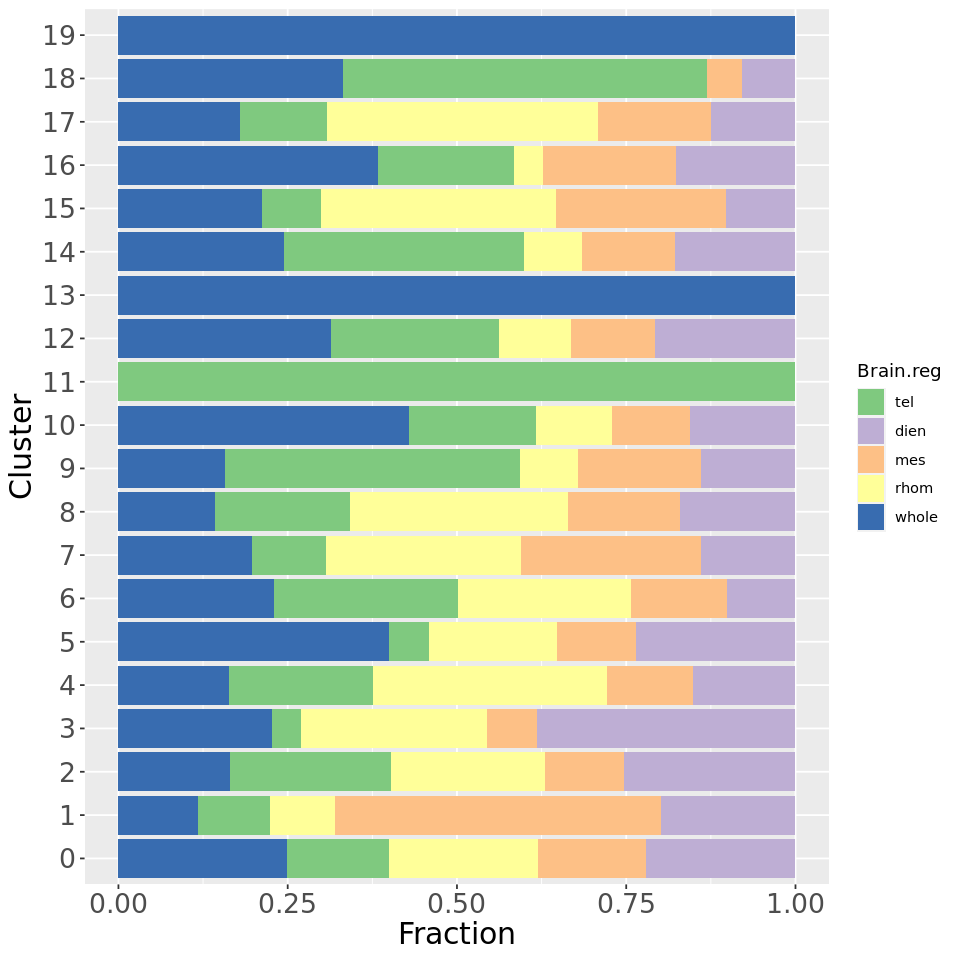

In [34]:
options(repr.plot.width=8, repr.plot.height=8)

p_br


Most clusters are a mix of regions, some are very specific but those are the clusters that are already flagged for merging.  

### Expression of previously known marker genes

#### Masud 2017 review

Starting from prior knowledge: markers taken from table in Masud et al 2017 (http://dx.doi.org/10.1016/bs.ctdb.2016.10.006) allow a slightly better characterization. Still looking for a more thorough list.    
Neutrophils & macrophages: lcp1, coro1a  
Neutrophils: lyz  
Macrophages: mpeg1.1, mfap4  
Microglia: apoeb  
Activated neutrophils & macrophages: il1b, tnfa, myd88    

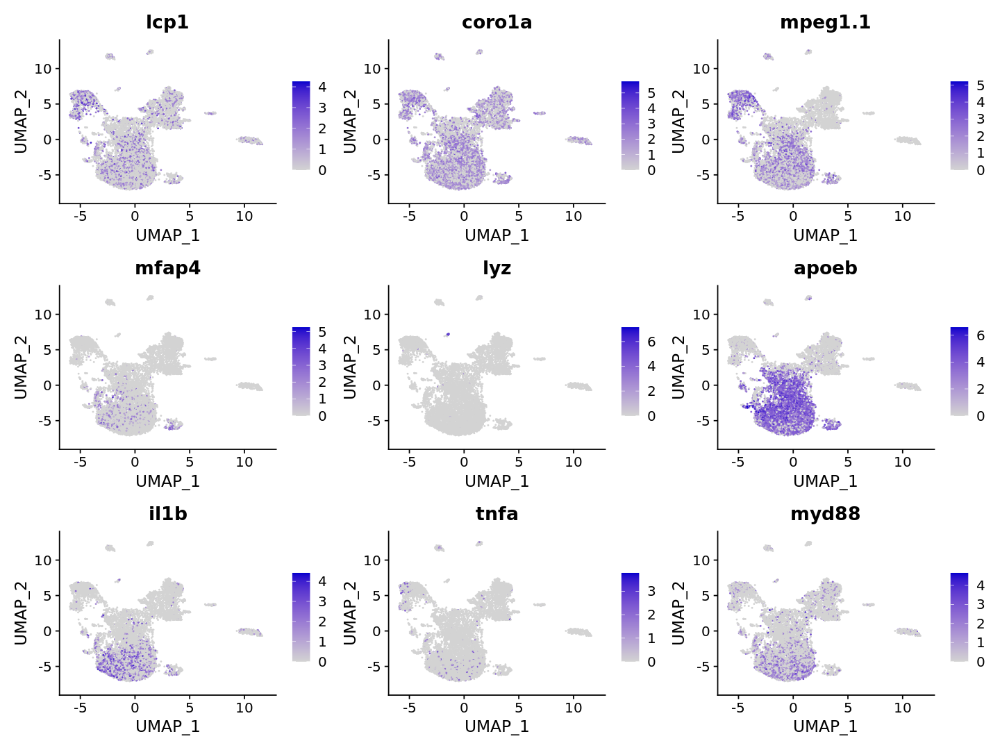

In [36]:
options(repr.plot.width=12, repr.plot.height=9)

FeaturePlot(object = imm_pool, reduction = 'umap', 
            features = c("lcp1", "coro1a", "mpeg1.1", "mfap4", 
                         "lyz", "apoeb","il1b", "tnfa", "myd88"), 
            ncol = 3, cols = c("lightgrey","mediumblue"))

#### Janita's marker list

At one point I had asked Janita for help withresolving immune cell types and she provided a list of markers she finds reliable.  

In [37]:
featurelist.immune <- c("col1a1a", "myl7", "hbba1", "fli1a", # ambient RNA contaminated
                 "mhc2dab", "cd74a", # antigen-presenting cells
                 "igl3v5","igic1s1","ighv1-4", # B cells
                 "si:ch211-214p16.1","zap70","sla2","traf1", # T cells
                 "gata3", "il4", "il13", # T cells extended
                 "ccr7", # lymphocyte activation
                 "ccr9a", # lymphoid precursor
                 "ccl38.6", # general immune response activation
                 "lyz","mpx", # neutrophils
                 "id2a", "epdl1", # formerly monocytes - now we think these could be tissue-resident macrophages
                 "mmp13a",
                 "pcna", "mki67", # proliferation
                 "mpeg1.1","grn1","marco", # macrophages
                 "il1b","apoeb","cd59","csf1ra", "spi1b", "cox7b", # macrophages extended
                 "c1qa", "c1qc", "havcr1", # complement / phagocytosis
                 "cd4-1", "cd8a", "cd8b", "foxp3a", # T cell subtypes
                 "gata2a" # eosinophils?
                 ) 

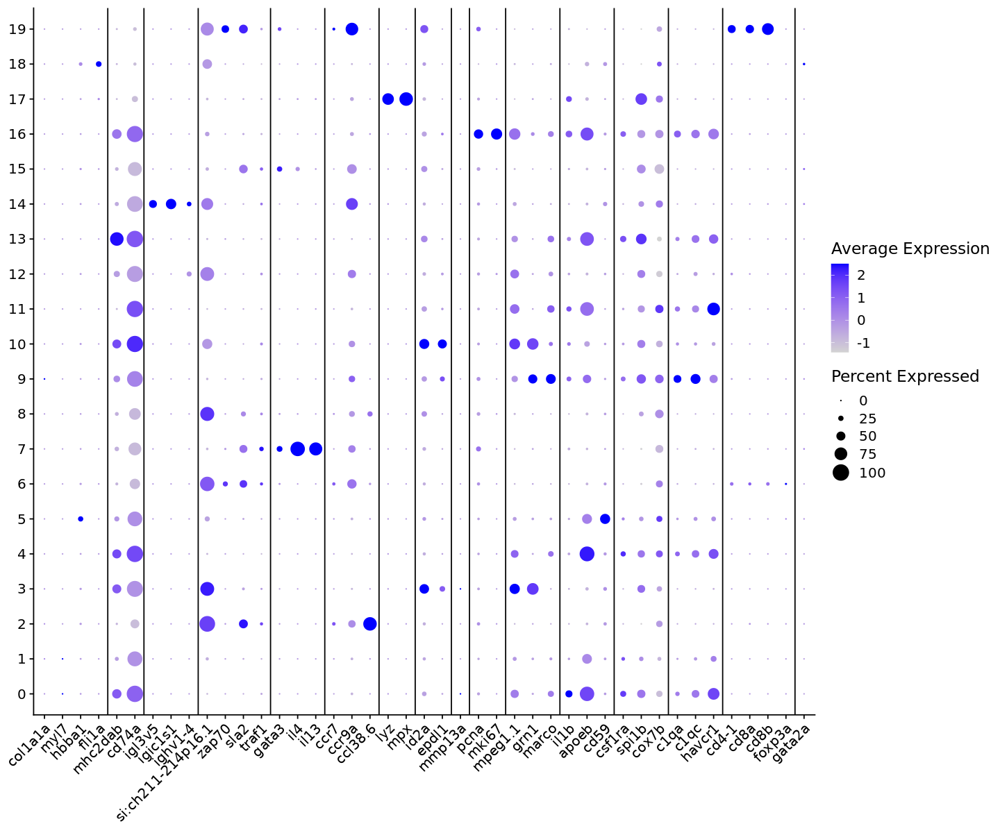

In [38]:
options(repr.plot.width=12, repr.plot.height=10)

DotPlot(imm_pool, features = featurelist.immune) + RotatedAxis() + 
    geom_vline(xintercept = c(4.5,6.5,9.5,13.5,16.5,19.5,21.5,23.5,24.5,26.5,29.5,32.5,35.5,38.5,42.5)) + 
    theme(axis.title.x = element_blank(),axis.title.y = element_blank())

### Inspect similar clusters for possible difference in markers


It's possible that clusters that appear very similar by markers in the all-vs-all comparison have some subtle difference when compared one-on-one. This is particularly true for small clusters that might appear at high resolution due to some technical artefact. I check for this here. In case valid markers are found, include in final annotation, otherwise merge clusters.  
The cases where no solid markers could be found:   
cluster 1 vs 0   
cluster 4 vs 0   
cluster 1 vs 4 (maybe)  
cluster 13 vs 0, 1 or 4  
cluster 9 vs 3    
cluster 10 vs 3   
cluster 15 vs 2 (to find more specific markers)  

In [8]:
table(imm_pool@active.ident)


   0    1    2    3    4    5    6    7    8    9   10   11   12   13   14   15 
2784 1697 1026  860  839  643  567  285  276  253  224  211  143   92   88   72 
  16   17   18   19 
  56   46   37   35 

In [12]:
# cluster 1 is a bit split on the UMAP so for better visualization I highlight cells
cells_cl1 <- WhichCells(imm_pool, ident = 1)
head(cells_cl1)

[1] "B1.T_AATGGCTGGGTAGG-1" "B1.T_ACCCTCGACTACTT-1" "B1.T_ACGTCCTGGAATGA-1"
[4] "B1.T_AGCTGAACCCAAGT-1" "B1.T_ATCGCAGAGGGACA-1" "B1.T_CCAGCTACTACGAC-1"

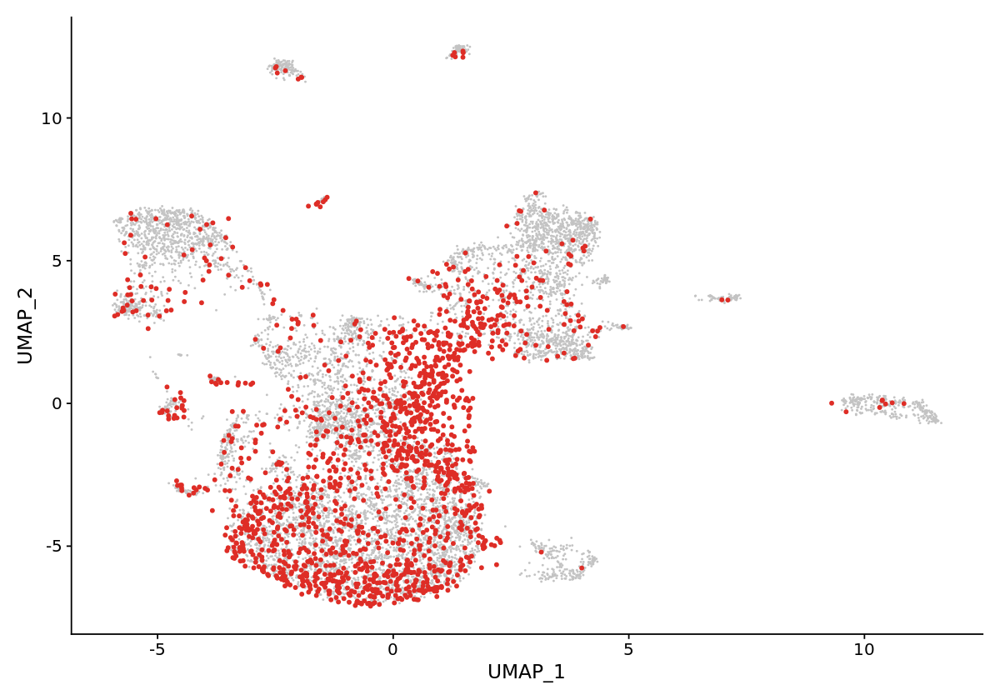

In [13]:
options(repr.plot.width=10, repr.plot.height=7)

DimPlot(imm_pool, label = FALSE, cells.highlight = cells_cl1) + NoLegend()

This is even more messy than I originally thought.  

In [9]:
markers_1_vs_0 <- FindMarkers(imm_pool, ident.1 = 1, ident.2 = 0, 
  min.pct = 0.2, logfc.threshold = 0.2, test.use = "bimod")

In [10]:
markers_1_vs_0$gene <- rownames(markers_1_vs_0)
top_markers_1_vs_0 <- markers_1_vs_0 %>% top_n(n = 20, wt = avg_log2FC) %>% select(gene)
top_markers_1_vs_0 <- as.vector(top_markers_1_vs_0$gene)

In [ ]:
options(repr.plot.width=16, repr.plot.height=15)

FeaturePlot(object = imm_pool, reduction = 'umap', features = top_markers_1_vs_0, 
            ncol = 4, cols = c("lightgrey","mediumblue"),
           raster = FALSE)

Impossible to detect specific markers in FeaturePlot because of the dispersion of the cluster, but no candidates seem very strong either.  

In [17]:
markers_4_vs_0 <- FindMarkers(imm_pool, ident.1 = 4, ident.2 = 0, 
  min.pct = 0.2, logfc.threshold = 0.2, test.use = "bimod")

In [18]:
markers_4_vs_0$gene <- rownames(markers_4_vs_0)
top_markers_4_vs_0 <- markers_4_vs_0 %>% top_n(n = 20, wt = avg_log2FC) %>% select(gene)
top_markers_4_vs_0 <- as.vector(top_markers_4_vs_0$gene)

In [ ]:
options(repr.plot.width=16, repr.plot.height=15)

FeaturePlot(object = imm_pool, reduction = 'umap', features = top_markers_4_vs_0, 
            ncol = 4, cols = c("lightgrey","mediumblue"),
           raster = FALSE)

The top expressed genes all encode for ribosomal proteins, and they don't really show a clear spatial pattern of expression in any cluster. So it seems like a merge of 4 with 0 would be alright.    

In [14]:
markers_1_vs_4 <- FindMarkers(imm_pool, ident.1 = 1, ident.2 = 4, 
  min.pct = 0.2, logfc.threshold = 0.2, test.use = "bimod")

In [15]:
markers_1_vs_4$gene <- rownames(markers_1_vs_4)
top_markers_1_vs_4 <- markers_1_vs_4 %>% top_n(n = 20, wt = avg_log2FC) %>% select(gene)
top_markers_1_vs_4 <- as.vector(top_markers_1_vs_4$gene)

In [ ]:
options(repr.plot.width=16, repr.plot.height=15)

FeaturePlot(object = imm_pool, reduction = 'umap', features = top_markers_1_vs_4, 
            ncol = 4, cols = c("lightgrey","mediumblue"),
           raster = FALSE)

Most of the genes seem like dissociation response and not very biologically relevant.  
Conclusion: 1 and 4 can be treated as single cluster and in fact both can be merged with cluster 0 as microglia. The biggest problem in this case is cluster 1 which is very spread out on the UMAP, howvwer I was not able to correct this with any changes of clustering parameters. Most likely it is either an artefact of the regression or of the SoupX ambient RNA removal. Given that immune cells are not the main focus on the paper I will accept this for now.   
Another very similar cluster to these is cluster 13, which I now compare only to 0.  

In [20]:
markers_13_vs_0 <- FindMarkers(imm_pool, ident.1 = 13, ident.2 = 0, 
  min.pct = 0.2, logfc.threshold = 0.2, test.use = "bimod")

In [22]:
markers_13_vs_0$gene <- rownames(markers_13_vs_0)
top_markers_13_vs_0 <- markers_13_vs_0 %>% top_n(n = 20, wt = avg_log2FC) %>% select(gene)
top_markers_13_vs_0 <- as.vector(top_markers_13_vs_0$gene)

In [24]:
head(top_markers_13_vs_0)

[1] "si:dkey-88j15.3" "csf1rb"          "naca"            "rpl9"           
[5] "rpl29"           "rpl14"

In [ ]:
options(repr.plot.width=16, repr.plot.height=15)

FeaturePlot(object = imm_pool, reduction = 'umap', features = top_markers_13_vs_0, 
            ncol = 4, cols = c("lightgrey","mediumblue"),
           raster = FALSE)

For the most part the gene expression seems to overlap (only aparent unique marker is si:dkey-88j15.3). Given the small size of the cluster and the overlap on UMAP, I will also add this one to the larger microglia cluster (0,1,4).   

Now I look into the three macrophage clusters, that are actually more distinct on the UMAP so this should yield a more defined set of markers.  

In [25]:
markers_9_vs_3 <- FindMarkers(imm_pool, ident.1 = 9, ident.2 = 3, 
  min.pct = 0.2, logfc.threshold = 0.2, test.use = "bimod")

In [26]:
markers_9_vs_3$gene <- rownames(markers_9_vs_3)
top_markers_9_vs_3 <- markers_9_vs_3 %>% top_n(n = 20, wt = avg_log2FC) %>% select(gene)
top_markers_9_vs_3 <- as.vector(top_markers_9_vs_3$gene)

In [ ]:
options(repr.plot.width=16, repr.plot.height=15)

FeaturePlot(object = imm_pool, reduction = 'umap', features = top_markers_9_vs_3, 
            ncol = 4, cols = c("lightgrey","mediumblue"),
           raster = FALSE)

Definitely distinct from cluster 3. However most of the markers found here were already previously identified in the all-vs-all approach.    

In [28]:
markers_10_vs_3 <- FindMarkers(imm_pool, ident.1 = 10, ident.2 = 3, 
  min.pct = 0.2, logfc.threshold = 0.2, test.use = "bimod")

In [29]:
markers_10_vs_3$gene <- rownames(markers_10_vs_3)
top_markers_10_vs_3 <- markers_10_vs_3 %>% top_n(n = 20, wt = avg_log2FC) %>% select(gene)
top_markers_10_vs_3 <- as.vector(top_markers_10_vs_3$gene)

In [ ]:
options(repr.plot.width=16, repr.plot.height=15)

FeaturePlot(object = imm_pool, reduction = 'umap', features = top_markers_10_vs_3, 
            ncol = 4, cols = c("lightgrey","mediumblue"),
           raster = FALSE)

Although similar to cluster 3, cluster 10 definitely has enough unique markers to warrant a separate identity. The most unique appears to be ccl35.2.    

The final question mark I have is about cluster 15 (probably a subtype of T cell) comapared to the other T cells (2, 6, 8). What are the unique markers for 15?  

In [31]:
markers_15_vs_2 <- FindMarkers(imm_pool, ident.1 = 15, ident.2 = 2, 
  min.pct = 0.2, logfc.threshold = 0.2, test.use = "bimod")

In [32]:
markers_15_vs_2$gene <- rownames(markers_15_vs_2)
top_markers_15_vs_2 <- markers_15_vs_2 %>% top_n(n = 20, wt = avg_log2FC) %>% select(gene)
top_markers_15_vs_2 <- as.vector(top_markers_15_vs_2$gene)

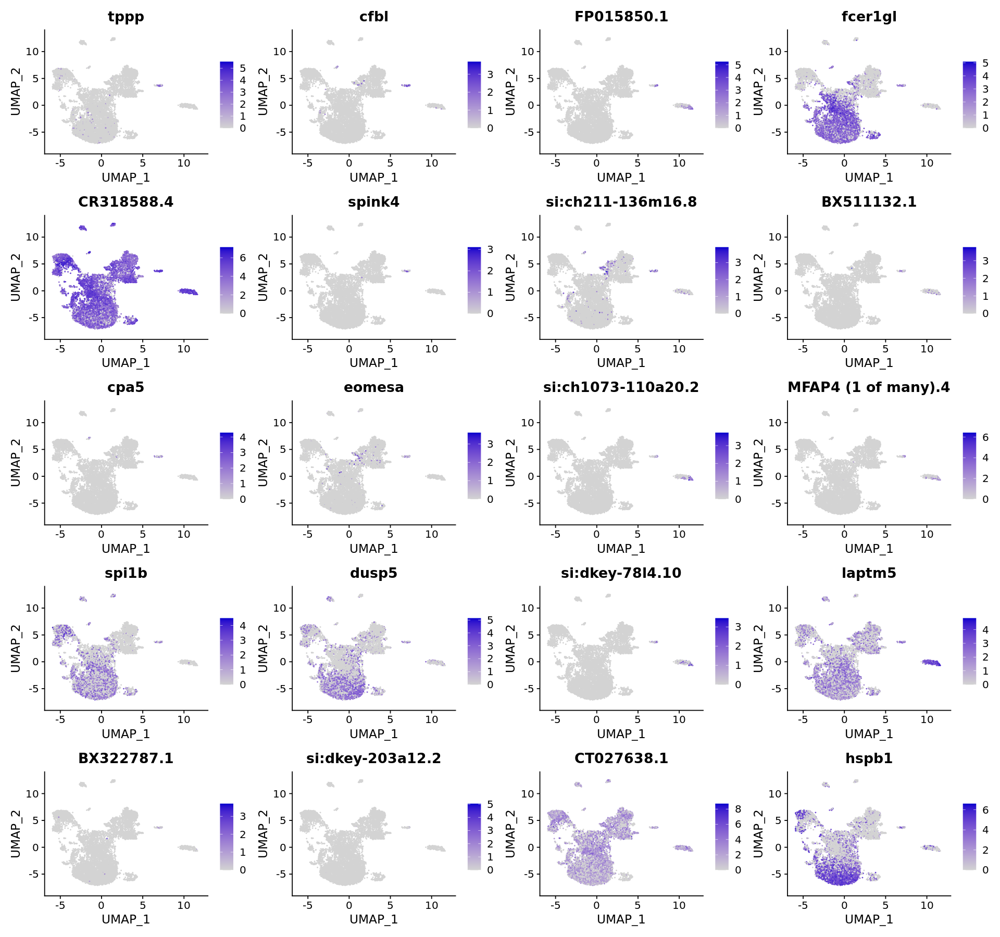

In [33]:
options(repr.plot.width=16, repr.plot.height=15)

FeaturePlot(object = imm_pool, reduction = 'umap', features = top_markers_15_vs_2, 
            ncol = 4, cols = c("lightgrey","mediumblue"),
           raster = FALSE)

Most have been seen before (tppp, cfbl, spink4). A possibly new one is cpa5.  

### Annotate clusters

#### Step 1: reorder numeric cluster names

In [5]:
# save original numeric names
#imm_pool$pc20_res0.6_clusters_numeric <- Idents(imm_pool)

In [6]:
# if needed to restore original numeric cluster names
Idents(imm_pool) <- imm_pool$pc20_res0.6_clusters_numeric

In [7]:
table(imm_pool$pc20_res0.6_clusters_numeric)


   0    1    2    3    4    5    6    7    8    9   10   11   12   13   14   15 
2784 1697 1026  860  839  643  567  285  276  253  224  211  143   92   88   72 
  16   17   18   19 
  56   46   37   35 

In [34]:
# add numeric names that reflect final clustering with manual corrections
# add +1 to cluster names so they start with 1 (I prefer this for the manuscript figure)
# manually merge clusters that co-localize on UMAP and show no sufficient marker distinction
# move clusters that I flagged for exclusion based on batch effect / high likelihood of doublet ID to the end of the numnbers sequence

imm_pool <- RenameIdents(object = imm_pool, 
                        "0" = "1",
                         "1" = "1", # merge with former 0
                         "2" = "2", 
                         "3" = "3",
                         "4" = "1", # merge with former 0
                         "5" = "15", # this is either a doublet cluster or high ambient contamination - move to the end for easier exclusion
                         "6" = "4", 
                         "7" = "5", 
                         "8" = "6", 
                         "9" = "7",
                         "10" = "8",
                         "11" = "16", # similar to 0 but with strong batch effect (only one lib) - move to the end for easier exclusion
                         "12" = "9",
                         "13" = "1", #merge with former 0
                         "14" = "10",
                         "15" = "11",
                         "16" = "12",
                         "17" = "13",
                         "18" = "14",
                         "19" = "17" # similar to 2/6/8 but with strong batch effect (only one lib) - keep at the end for easier exclusion
                         # 19 could have been merged with 6 but it has some conflicting markers (eg proliferation) and it's very small so I just exclude it
                        )

#stash
imm_pool[["pc20_res0.6_clusters_numeric_edited"]] <- Idents(object = imm_pool)

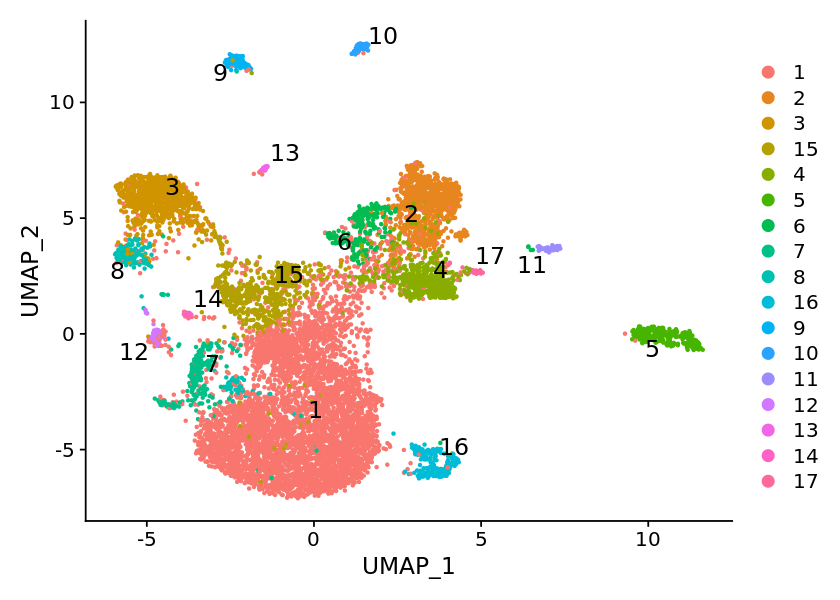

In [35]:
options(repr.plot.width=7, repr.plot.height=5)

DimPlot(object = imm_pool, reduction = 'umap', label = TRUE, label.size = 5, pt.size = 0.6, repel = TRUE)

#### Step 2: recalculate fraction brain region + replot markers

In [36]:
brain.reg.by.cluster <- table(imm_pool$brain_reg, imm_pool$pc20_res0.6_clusters_numeric_edited)

In [37]:
brain.reg.by.cluster.diss <- brain.reg.by.cluster[c(1:4),]
brain.reg.by.cluster.diss

      
         1   2   3  15   4   5   6   7   8  16   9  10  11  12  13  14  17
  dien 891 227 243  88  46  33  44  33  20   0  20  12   6   6   5   2   0
  mes  905  79  36  33  48  47  32  32  11   0   9   7  11   5   5   1   0
  rhom 601 141 121  49  80  47  57  14  10   0   7   4  14   1  11   0   0
  tel  377 125  16  13  72  15  30  60  14 211  14  14   3   4   3   8   0

In [38]:
#margin = 1 sums across rows (how is brain reg distributed over clusters)
brain.reg.by.cluster.diss.norm <- round(prop.table(brain.reg.by.cluster.diss, margin = 1), digits = 10)
#brain.reg.by.cluster.norm <- brain.reg.by.cluster.perc1 * 100

In [39]:
brain.reg.by.cluster.diss.norm

      
                  1            2            3           15            4
  dien 0.5316229117 0.1354415274 0.1449880668 0.0525059666 0.0274463007
  mes  0.7176843775 0.0626486915 0.0285487708 0.0261697066 0.0380650278
  rhom 0.5194468453 0.1218668971 0.1045808124 0.0423509075 0.0691443388
  tel  0.3850868233 0.1276813075 0.0163432074 0.0132788560 0.0735444331
      
                  5            6            7            8           16
  dien 0.0196897375 0.0262529833 0.0196897375 0.0119331742 0.0000000000
  mes  0.0372720063 0.0253766852 0.0253766852 0.0087232355 0.0000000000
  rhom 0.0406222990 0.0492653414 0.0121002593 0.0086430424 0.0000000000
  tel  0.0153217569 0.0306435138 0.0612870276 0.0143003064 0.2155260470
      
                  9           10           11           12           13
  dien 0.0119331742 0.0071599045 0.0035799523 0.0035799523 0.0029832936
  mes  0.0071371927 0.0055511499 0.0087232355 0.0039651071 0.0039651071
  rhom 0.0060501296 0.0034572169 0.01210025

In [40]:
#margin = 2 sums across columns (which brain regs make up each cluster) - this is what I need for per cluster calculation
#use as input rowwise normalized data
brain.reg.by.cluster.diss.df <- as.data.frame(round(prop.table(brain.reg.by.cluster.diss.norm, margin = 2), digits = 10))
colnames(brain.reg.by.cluster.diss.df) <- c("Brain.reg", "Cluster", "Fraction")

In [41]:
head(brain.reg.by.cluster.diss.df)

,Brain.reg,Cluster,Fraction
,<fct>,<fct>,<dbl>
1,dien,1,0.2468255
2,mes,1,0.3332114
3,rhom,1,0.2411723
4,tel,1,0.1787907
5,dien,2,0.3025690
6,mes,2,0.1399538


In [44]:
p_br_diss <- ggplot(data = brain.reg.by.cluster.diss.df, aes(x = Cluster, y = Fraction, fill = Brain.reg)) + geom_bar(stat="identity") + 
coord_cartesian(ylim = c(0,1)) + labs(x="Cluster", y="Fraction") +  
theme(axis.title = element_text(size = 18), axis.text = element_text(size = 16),   plot.title = element_text(size = 16, hjust = 0.5))  + 
coord_flip() + scale_fill_manual(values = reg_colors)

Coordinate system already present. Adding new coordinate system, which will replace the existing one.



Warning message:
“Removed 4 rows containing missing values (position_stack).”


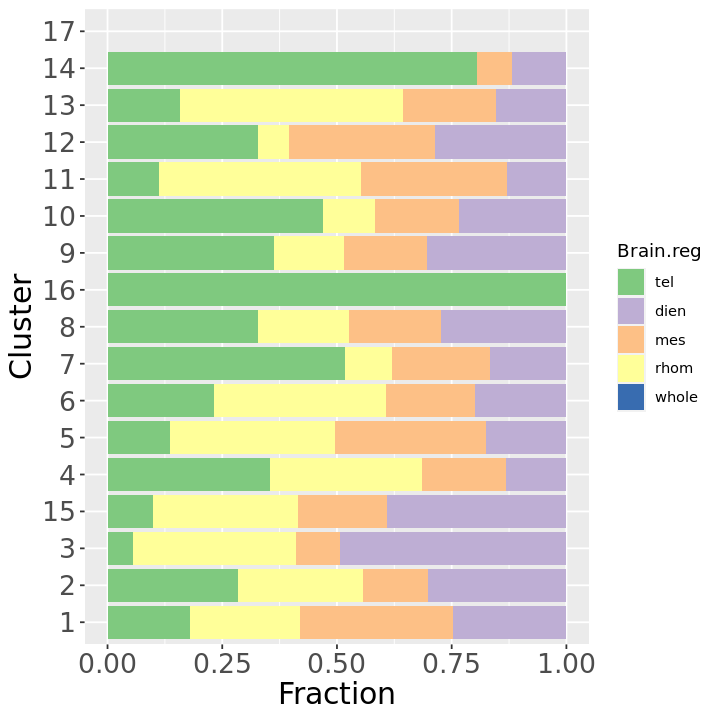

In [45]:
options(repr.plot.width=6, repr.plot.height=6)

p_br_diss

Most clusters show highly mixed regional profile (except those already flagged for exclusion and cluster 14 - maybe trombocytes - which is very small). This is as expected and helps to build the argument that radial glia differs from this type of brain-wide distribution.  

Replot markers for the new clustering.

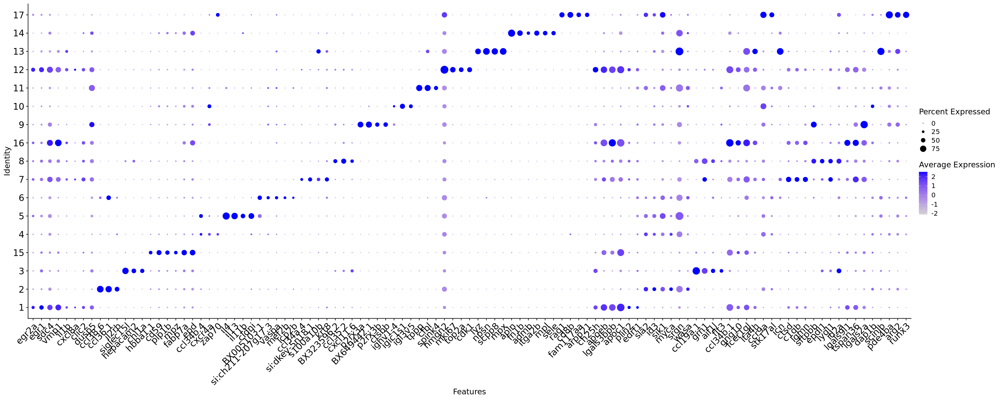

In [60]:
options(repr.plot.width=25, repr.plot.height=10)

dotplot_all <- DotPlot(imm_pool, features = all_markers_vector) + theme(axis.text.x = element_text(angle = 45, size = 16, hjust = 1, vjust = 1), axis.text.y = element_text(size = 16)) + RotatedAxis()
dotplot_all

#### Step 3: assign biologically meaningful cluster names
Based on known classification into major immune subtype + specific marker from this dataset if necessary.

In [69]:
# restore "corrected" numeric cluster names
Idents(imm_pool) <- imm_pool$pc20_res0.6_clusters_numeric_edited

In [70]:
table(imm_pool@active.ident)


   1    2    3   15    4    5    6    7    8   16    9   10   11   12   13   14 
5412 1026  860  643  567  285  276  253  224  211  143   88   72   56   46   37 
  17 
  35 

In [71]:
imm_pool <- RenameIdents(object = imm_pool, 
                         "1" = "Microglia",  
                         "2" = "T cells il2rb+",  
                         "3" = "Macrophages siglec15l+", # grn1 maybe means it should be microglia? check with Klara  
                         "4" = "T cells zap70+", 
                         "5" = "Th2-like cells il4+", # il4/il13+
                         "6" = "T cells lcp2b+", 
                         "7" = "Macrophages ccl34a.4+", 
                         "8" = "Macrophages ccl35.2+", 
                         "9" = "Macrophages p2rx3a+",
                         "10" = "B cells",
                         "11" = "T cell-like spink4+", 
                         "12" = "Proliferating immune cells",
                         "13" = "Neutrophils", 
                         "14" = "Blood vessel/thrombocytes",
                         "15" = "Immune/other doublet",
                         "16" = "Microglia (batchy)",
                         "17" = "T cell (batchy)"
                        )

#stash
imm_pool[["pc20_res0.6_named_detailed"]] <- Idents(object = imm_pool)

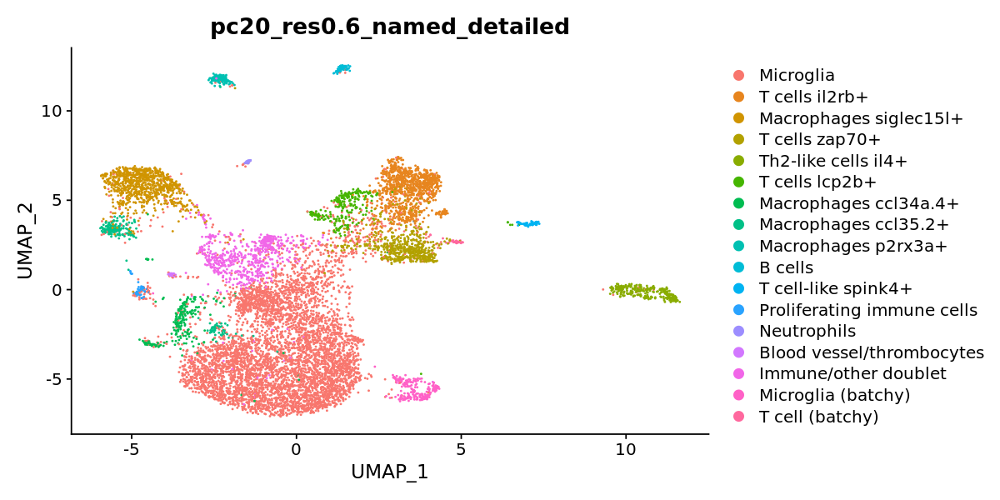

In [72]:
options(repr.plot.width=10, repr.plot.height=5)

DimPlot(imm_pool, group.by = "pc20_res0.6_named_detailed")

For easier plotting also add a shorter version of the same names.

In [73]:
# restore "corrected" numeric cluster names
Idents(imm_pool) <- imm_pool$pc20_res0.6_clusters_numeric_edited

In [74]:
table(imm_pool@active.ident)


   1    2    3   15    4    5    6    7    8   16    9   10   11   12   13   14 
5412 1026  860  643  567  285  276  253  224  211  143   88   72   56   46   37 
  17 
  35 

In [75]:
imm_pool <- RenameIdents(object = imm_pool, 
                         "1" = "Mgl",  
                         "2" = "Tc il2rb+",  
                         "3" = "Mcph siglec15l+", # grn1 maybe means it should be microglia? check with Klara  
                         "4" = "Tc zap70+", 
                         "5" = "Th2-like il4+", # il4/il13+
                         "6" = "Tc lcp2b+", 
                         "7" = "Mcph ccl34a.4+", 
                         "8" = "Mcph ccl35.2+", 
                         "9" = "Mcph p2rx3a+",
                         "10" = "Bc",
                         "11" = "Tc-like spink4+", 
                         "12" = "Prol. imm",
                         "13" = "Neut", 
                         "14" = "BV/throm",
                         "15" = "Imm/other",
                         "16" = "Mgl (batchy)",
                         "17" = "Tc (batchy)"
                        )

#stash
imm_pool[["pc20_res0.6_named_detailed_short"]] <- Idents(object = imm_pool)

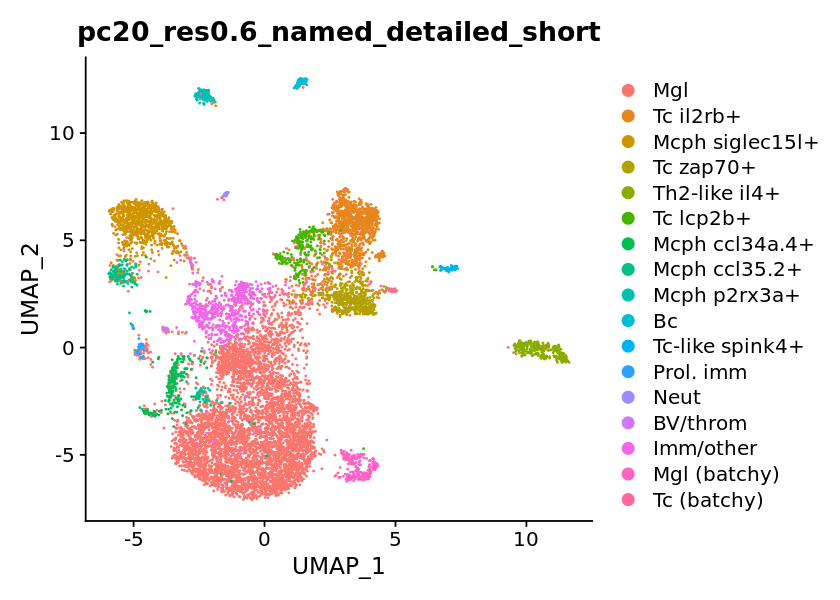

In [76]:
options(repr.plot.width=7, repr.plot.height=5)

DimPlot(imm_pool, group.by = "pc20_res0.6_named_detailed_short")

Finally, for the plots in the manuscript include number in front of the name to keep Fig 2 and Fig 1 linked.  

In [3]:
# restore "corrected" numeric cluster names
Idents(imm_pool) <- imm_pool$pc20_res0.6_clusters_numeric_edited

In [4]:
table(imm_pool@active.ident)


   1    2    3   15    4    5    6    7    8   16    9   10   11   12   13   14 
5412 1026  860  643  567  285  276  253  224  211  143   88   72   56   46   37 
  17 
  35 

In [5]:
imm_pool <- RenameIdents(object = imm_pool, 
                         "1" = "1. Mgl",  
                         "2" = "2. Tc il2rb+",  
                         "3" = "3. Mcph siglec15l+", # grn1 maybe means it should be microglia? check with Klara  
                         "4" = "4. Tc zap70+", 
                         "5" = "5. Th2-like il4+", # il4/il13+
                         "6" = "6. Tc lcp2b+", 
                         "7" = "7. Mcph ccl34a.4+", 
                         "8" = "8. Mcph ccl35.2+", 
                         "9" = "9. Mcph p2rx3a+",
                         "10" = "10. Bc",
                         "11" = "11. Tc-like spink4+", 
                         "12" = "12. Prol. imm",
                         "13" = "13. Neut", 
                         "14" = "14. BV/throm",
                         "15" = "15. Imm/other",
                         "16" = "16. Mgl (batchy)",
                         "17" = "17. Tc (batchy)"
                        )

#stash
imm_pool[["pc20_res0.6_named_detailed_short_num"]] <- Idents(object = imm_pool)

#### Eliminate doublets

In [6]:
# for final plot reorder clusters & remove doublets
Idents(imm_pool) <- imm_pool$pc20_res0.6_clusters_numeric_edited

In [7]:
# remove clusters that correspond to doublets & strong batch effects
imm_pool_sub <- subset(imm_pool, idents = c(15, 16, 17), invert = TRUE)
table(imm_pool_sub@active.ident)


   1    2    3    4    5    6    7    8    9   10   11   12   13   14 
5412 1026  860  567  285  276  253  224  143   88   72   56   46   37 

### Resave/ load dataset

In [32]:
# save after adding more metadata
saveRDS(imm_pool, file = "/local/Nina/jupyterlab/brains_trans/imm_pool_reg.rds")

In [2]:
imm_pool <- readRDS(file = "/local/Nina/jupyterlab/brains_trans/imm_pool_reg.rds")

In [33]:
saveRDS(imm_pool_sub, file = "/local/Nina/jupyterlab/brains_trans/imm_pool_sub_reg.rds")

In [2]:
imm_pool_sub <- readRDS(file = "/local/Nina/jupyterlab/brains_trans/imm_pool_sub_reg.rds")